<br><h2> Customer Segmentation (Unsupervised Machine Learning for Cluster Analysis) </h2>
<br> 

<div style="font-family: Arial; font-size: 11pt; font-weight: bold; line-height:1.5">
<br> 
&emsp; This project employs unsupervised machine learning for cluster analysis and customer segmentation. The dataset used here is comprised of thousands of records of customer purchases and shopping habits. The goal of this project is, first, to analyze and understand in depth the customer base present in the dataset, and, second, to utilize machine learning algorithms for cluster analysis in order to breakdown the customer base into distinct clusters customer groups. Cluster analysis can be very useful for understanding a customer base and aiding businesses to tailor targeted marketing strategies, optimize their product offerings, and be better able to meet their customers' needs and enhance their shopping experience. As such, after segmenting the customer base into separate groups, the groups will then be analyzed and compared to develop a thorough understanding of the different customer groups, their characteristics, preferences, shopping habits and their needs. This subsequently will guide efforts to curate targeted marketing campaigns, develop customer retention strategies, and/or enhance overall customer satisfaction and loyalty. <br>

<br>

&emsp; The present dataset was taken from Kaggle.com, a popular platform for finding and publishing datasets. You can quickly access it by clicking [here](https://www.kaggle.com/datasets/zeesolver/consumer-behavior-and-shopping-habits-dataset/data). The dataset consists of around 4,000 records of customer purchases. For each entry here, a customer is assigned a unique identifier and their purchase, preferences, and other relevant details are recorded. Indeed, the dataset encompasses a wide variety of variables, including demographic information about the customers, their shopping frequency and purchase history, their product preferences and overall satisfaction with the product purchased. This, therefore, makes the current dataset ideal analyzing and understanding consumer behavior, decision-making, and for the purposes of cluster analysis and customer segmentation. 
<br> 
<br>

**You can view each column and its description in the table below:** <br> </div>  

| **Variable**      | **Description**                                                                                         |
| :-----------------| :------------------------------------------------------------------------------------------------------ |
| **Customer ID**   | Unique identifier for each customer       |
| **Age**           | Age of the customer                       |
| **Gender**        | Gender of the customer                    |
| **Item Purchased** | Item or product purchased              |
| **Category**      | Category of the item purchased (e.g., clothing, accessory, etc.)          |
| **Purchase Amount (USD)**| Amount spent (in USD) in a given transaction |
| **Location**      | Location from which a purchase was made         |
| **Size**          | Size of the purchased item (if applicable) |
| **Color**         | Color of the purchased item or product     |
| **Season**        | Season in which the item was purchased (e.g., winter, spring, etc.)  |
| **Review Rating** | Rating score given by a customer for the item purchased (on a 5-point rating scale) |
| **Subscription Status** | Indicates whether or not a customer is subscribed to the brand or shop service |
| **Shipping Type** | Method of delivery or shipping type (e.g., standard shipping, express, store pickup, etc.) |
| **Discount Applied** | Indicates whether or not a discount was applied to the purchase  |
| **Promo Code Used** | Indicates whether or or not a promo code or coupon was used during purchase        |
| **Previous Purchases** | Number of prior purchases made by the same customer  |
| **Payment Method** | Method of payment for the purchase (e.g., cash, credit card, paypal, etc.)     |
| **Frequency of Purchases** | Frequency of engagement of a customer in purchasing activities (e.g., weekly, monthly, annually, etc.)   |

<br>
<br>
<br>

<div style="font-family: Arial; font-size: 11pt; font-weight: bold; line-height:1.5">

&emsp; In order to perform cluster analysis to segment customers into different clusters, first the data was inspected, engineered, and processed in preparation for analysis and modeling. After preparing the data, four clustering algorithms were developed and evaluated in order to find the most suitable algorithm for task. Having obtained the best clustering model for the data, customers were segmented into groups and the resultant customer groups were analyzed in depth. A report was written describing the findings and identifying the main characteristics or unique features of each customer group, as well as describing the overall similarities and dissimilarities between the customer groups. On the basis of this report, a subsequent section was developed laying out the key insights and takeaways of the cluster analysis as well as providing recommendations to improve sales or curate better marketing campaigns tailored to each customer group separately. <br>
<br>
<br>
</div>

<div style="font-family: Arial; font-size: 11.5pt; font-weight: bold; line-height:1.5">

<strong> Overall, this project is broken down into 7 sections: </strong>
1. [Reading and Inspecting the Data](#reading-and-inspecting-the-data)
2. [Updating the Data](#updating-the-data)
3. [Exploratory Data Analysis](#exploratory-data-analysis)
4. [Data Preprocessing](#Data-Preprocessing)
5. [Model Development and Evaluation (Cluster Analysis)](#model-development-and-evaluation-(cluster-analysis))
6. [Model Interpretation](#model-interpretation)
7. [Key Insights and Recommendations](#key-insights-and-recommendations)
</div>
<br>



In [1]:
#If you're using the executable notebook version, please run this cell first 
# to install the necessary Python libraries for the task 
!pip install numpy 
!pip install pandas 
!pip install matplotlib 
!pip install seaborn 
!pip install scikit-learn

In [2]:
#Import the modules for use 
import math
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from IPython.display import display, Markdown
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.cluster import KMeans, MeanShift, AgglomerativeClustering, DBSCAN, estimate_bandwidth
from sklearn.metrics import silhouette_score, davies_bouldin_score

import warnings
warnings.simplefilter("ignore") 

#Adjust data display options 
pd.set_option('display.max_columns', None)

#Set context for plotting
sns.set_theme(context='paper', style='darkgrid')


**Defining Custom Functions**

In [3]:
#Defining Custom Functions for later use 
#Define function to get color palette for visualization
def get_colors(var, colors):
    if type(colors) == dict: 
        return colors.get(var)
    elif type(colors) in (str, list, tuple): 
        return colors 
    else: 
        return colors.colors
    
#Define function to create and return a scatter plot
def get_scatterplot(x_var: str, y_var: str, clusters_var: str = None, colors: any = None): 
    ax=sns.scatterplot(data=df, x=x_var, y=y_var, hue=clusters_var, palette=colors, s=15, alpha=.75)
    ax.set_title(f'Relationship between {y_var} and {x_var}', fontsize=15)
    ax.set_xlabel(x_var, fontsize=12.5)
    ax.set_ylabel(y_var, fontsize=12.5)
    ax.legend(title=clusters_var, loc='upper right', alignment='left')

#Define function to create and return a boxen plot
def get_boxenplot(x_var: str, y_var: str, title_x: str, title_y: str, clusters_var: str = None, boxen: bool = True, colors: any = None, order: dict = None):
    if boxen:
        ax=sns.boxenplot(data=df, x=x_var, y=y_var, hue=clusters_var if clusters_var != None else x_var, palette=colors, saturation=.9,
                            order=order.get(x_var) if order!= None else None, alpha=.8 if len(np.unique(df[x_var]))<15 else 1, 
                            showfliers=False, width=.5, gap=.25 if len(np.unique(df[x_var])) < 10 else 0)
    else:
        ax=sns.boxplot(data=df, x=x_var, y=y_var, hue=clusters_var if clusters_var != None else x_var, 
                       palette=colors, order=order.get(x_var) if order!= None else None, 
                       width=.8, gap=.25 if len(np.unique(df[x_var])) < 10 else 0)        
        for artist in ax.artists:
            r, g, b, _ = artist.get_facecolor()
            artist.set_facecolor((r, g, b, 0.8))

    if len(np.unique(df[x_var])) > 8: 
        ax.set_aspect(aspect=(.4 if y_var != 'Purchase Amount (USD)' else .25))
    ax.set_title(f'Relationship between {title_y} and {title_x}', fontsize=15)
    ax.set_xlabel(x_var, fontsize=12.5)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=(90 if (len(ax.get_xticklabels()) > 5 and x_var !='Age Group') else None))
    ax.set_xlim(-1,len(ax.get_xticklabels())+0.2)
    ax.set_ylabel(y_var, fontsize=12.5)
    ax.legend(title=clusters_var, loc='upper right', alignment='left') 

#Define a function to create and return a heatmap 
def get_heatmap(x_var: str, y_var: str, title_x: str, title_y: str, clusters_var: str = None, colors: any = None, order: dict = None):  
    xy_crosstab = pd.crosstab(index=df[y_var], columns=[df[x_var], df[clusters_var]]).reindex((order.get(y_var)[::-1] if (order!= None and y_var in order) else None))        
    if len(xy_crosstab.columns) <= 4:
        xy_crosstab = xy_crosstab.reorder_levels([1, 0], axis=1).sort_index(axis=1, level=[0, 1])
        xy_crosstab = xy_crosstab.reorder_levels([1, 0], axis=1) 
    else:
        xy_crosstab=xy_crosstab.reindex(order.get(x_var,None) if order!= None else None, axis=1, level=0)
        for category in xy_crosstab.columns.levels[0][1:]:
            xy_crosstab[(category, '')] = 0
        xy_crosstab = xy_crosstab.sort_index(axis=1, level=[0, 1]).reindex(order.get(x_var,None) if order!= None else None, axis=1, level=0)
    ax=sns.heatmap(xy_crosstab, ax=plt.gca(),  cmap='gray_r', annot=True, fmt='.0f', alpha=.65, linewidths=.8, annot_kws={'color':'w' if len(xy_crosstab.columns) > 4 else None})
    ax.set_aspect(2 if (len(xy_crosstab.columns) > 4 and len(xy_crosstab.columns) >= len(xy_crosstab.index) and title_x!='Item Purchased') else 'auto')
    ax.set_title(f'Relationship between {title_y} and {title_x}', fontsize=(12 if (ax.get_aspect()!='auto' and len(xy_crosstab.columns) > 16) else 15))
    ax.set_xlabel(' — '.join(ax.get_xlabel().split('-')), fontsize=11)
    ax.set_ylabel(ax.get_ylabel(), fontsize=12.5)
    xticklabels = ['' if item.get_text().endswith('-') else item for item in ax.get_xticklabels()]
    ax.set_xticklabels(xticklabels, fontsize=(6 if len(ax.get_xticklabels())>10 else 8))
    ax.set_yticklabels(ax.get_yticklabels(), rotation=(90 if 10 < len(ax.get_yticklabels()) <= 4 else None), fontsize=8)
    colors_dict={'Cluster 1': colors[0], 'Cluster 2': colors[1], 'Cluster 3': colors[2], '': 'w'}
    col_colors = [colors_dict[i] for i in xy_crosstab.columns.get_level_values(1)]
    for i, color in enumerate(col_colors):
        ax.fill_betweenx(y=[0,len(xy_crosstab.index)+1], x1=i, x2=i+1, color=color, alpha=.45)

#Define a function to create and return a pie plot
def get_pieplot(x_var: str, y_var: str, title_x: str, title_y: str, colors: any = None):
    xy_crosstab = pd.crosstab(index=df[x_var], columns=df[y_var])
    flat_crosstab = xy_crosstab.stack().reset_index()
    flat_crosstab.columns = [x_var, y_var, 'Count']
    aggregated_data = flat_crosstab.groupby([y_var, x_var])['Count'].sum().reset_index()
    sizes = aggregated_data['Count']
    labels = [f"{row[x_var]} - {row[y_var]}" for _, row in aggregated_data.iterrows()]

    ax=plt.gca()
    wedges, texts, autotexts = ax.pie(sizes, labels=labels, colors=colors[::-1], autopct='%1.1f%%', startangle=100, labeldistance=1.05, frame=True, textprops=dict(fontsize=11), wedgeprops=dict(width=1, linewidth=2.5, edgecolor='lightgray', alpha=.8))
    for i,wedge in enumerate(wedges):
        if i % 2 != 0: 
            continue
        angle = math.radians((wedge.theta1) % 360)
        x, y = math.cos(angle), math.sin(angle)
        line = plt.Line2D([0, 1.01*x], [0, 1.01*y], transform=ax.transData, color='w', linestyle='-', linewidth=3)
        plt.gcf().add_artist(line)
    ax.set_title(f'Relationship between {title_y} and {title_x}', fontsize=15, pad=13)
    ax.patch.set_facecolor((ax.get_facecolor(),0.77))
    ax.set(xticks=[], yticks=[])
    ax.axis('equal')

#Define a function to create and return a bar plot
def get_barplot(x_var: str, y_var: str, title_x: str, title_y: str, clusters_var: str = None, colors: any = None, order: dict = None):
    if y_var == 'Review Rating':
        ax=sns.barplot(data=df, x=x_var, y=y_var, hue=clusters_var if clusters_var != None else x_var, palette=colors, alpha=.8, saturation=.9, gap=.1, errorbar=None, 
                       width=(.8 if len(np.unique(df[y_var]))>2 else .5), order=order.get(x_var) if order != None else None)
        ax.set_title(f'Relationship between {title_y} and {title_x}', fontsize=15)
        ax.set_xlabel(x_var, fontsize=12.5)
        ax.set_ylabel(y_var, fontsize=12.5)
        ax.set_xticklabels(ax.get_xticklabels(), rotation=(90 if (len(ax.get_xticklabels()) > 5 and x_var !='Age Group') else None))
        ax.set_ylim(0, 4.5)
    
    else:
        if clusters_var is None:
            color, cmap = None if len(colors) != 2 else colors, colors if len(colors) != 2 else None
            xy_crosstab = pd.crosstab(index=df[y_var], columns=df[x_var]).reindex(order.get(y_var,df[y_var].unique()) if type(order) == dict else df[y_var].unique(), axis=0)
            xy_crosstab = xy_crosstab.reindex(order.get(x_var, df[x_var].unique()) if type(order) == dict else df[x_var].unique(), axis=1, level=0)
            ax=xy_crosstab.plot(kind='bar', ax=plt.gca(), color=color, cmap=cmap, alpha=.8 if len(np.unique(df[x_var])) < 15 else 1, edgecolor='lightgray', rot=0)
            ax.set_title(f'Relationship between {title_y} and {title_x}', fontsize=15)
            ax.set_xlabel(y_var, fontsize=12.5)
            ax.set_xticklabels(ax.get_xticklabels(), rotation=(90 if (len(ax.get_xticklabels()) > 4 and y_var != 'Age Group') else None))
            ax.set_xlim(-1,len(ax.get_xticklabels())+0.2)
            ax.set_ylabel('Count', fontsize=12.5)

        else:
            if (title_y == 'Gender' and len(np.unique(df[title_x]))>2) or (title_x=='Gender' and len(np.unique(df[title_y]))==2):
                xy_crosstab = pd.crosstab(index=df[y_var], columns=[df[x_var], df[clusters_var]]).reindex(order.get(y_var,df[y_var].unique()) if type(order) == dict else df[y_var].unique(), axis=0) 
                xy_crosstab = xy_crosstab.sort_index(axis=1, level=[0,0]).reindex(order.get(x_var,df[x_var].unique()) if type(order) == dict else df[x_var].unique(), axis=1, level=0)
                colors_dict={'Cluster 1': colors[0], 'Cluster 2': colors[1], 'Cluster 3': colors[2]}
                colors = [colors_dict[i] for i in xy_crosstab.columns.get_level_values(1)]
                ax=xy_crosstab.plot(kind='bar', ax=plt.gca(), color=colors, alpha=.8 if len(np.unique(df[x_var])) < 15 else 1, edgecolor='lightgray', rot=0)
                ax.set_title(f'Relationship between {title_y} and {title_x}', fontsize=15)
                ax.set_xlabel(y_var, fontsize=12.5)
                ax.set_xticklabels(ax.get_xticklabels(), rotation=(90 if (len(ax.get_xticklabels()) > 4 and y_var != 'Age Group') else None))
                ax.set_xlim(-1,len(ax.get_xticklabels())+0.2)
                ax.set_ylabel('Count', fontsize=12.5)
        
            else:
                xy_crosstab = pd.crosstab(index=df[y_var], columns=[df[x_var], df[clusters_var]], dropna=False).sort_index(ascending=False, axis=0).reindex(order.get(y_var, df[y_var].unique()) if type(order) == dict else df[y_var].unique(), axis=0) 
                xy_crosstab = xy_crosstab.sort_index(axis=1, level=[1,1]).reindex(order.get(x_var,df[x_var].unique()) if order!= None else df[x_var].unique(), axis=1, level=0)
                colors_dict={'Cluster 1': colors[0], 'Cluster 2': colors[1], 'Cluster 3': colors[2]}
                ax=xy_crosstab.plot(kind='bar', ax=plt.gca(), color=[colors_dict[i] for i in xy_crosstab.columns.get_level_values(1)], alpha=.8 if len(np.unique(df[x_var])) < 15 else 1, edgecolor='lightgray', rot=0)
                ax.set_title(f'Relationship between {title_y} and {title_x}', fontsize=15)
                ax.set_xlabel(y_var, fontsize=12.5)
                ax.set_xticklabels(ax.get_xticklabels(), rotation=(90 if (len(np.unique(df[y_var])) > 4 and y_var != 'Age Group') else None))
                ax.set_xlim(-1,len(ax.get_xticklabels())+0.2)
                ax.set_ylabel('Count', fontsize=12.5)

                #Add hatching pattern to mark empty bars
                for cluster_idx, hatch_value in enumerate(xy_crosstab.columns.get_level_values(0)):
                    for bar in ax.containers[cluster_idx].patches:
                        bar.set_hatch('x') if hatch_value == np.unique(df[x_var])[0] else bar.set_hatch('')  
                
                #Add a horizontal line to indicate empty bar
                for cluster_idx in range(len(ax.containers)):
                    for bar in ax.containers[cluster_idx]:
                        if bar.get_height() == 0:
                            x = bar.get_x() + bar.get_width() / 2
                            y = bar.get_y()  
                            ax.plot([x - bar.get_width() / 2, x + bar.get_width() / 2], [y, y], color=[colors*2][0][cluster_idx], linestyle='-', linewidth=2)

                #adjust the legend's handles 
                legend_handles = []
                for cluster,color in colors_dict.items():
                    for hatch_value in np.unique(df[x_var])[::-1]:
                        legend_handles.append(Patch(facecolor=color, edgecolor='lightgray', hatch='xxx' if hatch_value == np.unique(df[x_var])[0] else '', label=f'{cluster} | {hatch_value}'))
                ax.legend(handles=legend_handles, title=f'Clusters | {x_var}', loc='upper right', alignment='left')


#Define helper function to analyze data and visualize the results
def Get_Plots(x_vars: str | list, y_vars : str | list, clusters_var: str = None, colors: any = plt.get_cmap('tab10'), order: dict = None, **kwargs):
    for y_var in pd.Index(y_vars):
        fig = plt.figure(facecolor='ghostwhite', dpi=150)
        if clusters_var is not None:
            n_cols, n_rows = 4, 4
            fig.set_size_inches(40, 35)
            plt.subplots_adjust(wspace=.28, hspace=.28, top=.94)
            plt.suptitle(f'Customer Segmentation by {y_var}', fontsize=33.5)
        else:
            n_cols = kwargs.get('n_cols', 4 if len(x_vars) - 1 > 5 else len(x_vars))
            n_rows = kwargs.get('n_rows', math.ceil(len(x_vars) / n_cols))
            fig.set_size_inches(12*n_cols, 10*n_rows)
            plt.subplots_adjust(wspace=.28, hspace=.28, top=.92)
            plt.suptitle(f'Bivariate Analysis by {y_var}', fontsize=33.5)

        for i,x_var in enumerate(pd.Index(x_vars).drop(labels=y_var, errors='ignore')):
            #Create subplot for current variables
            plt.subplot(n_rows, n_cols, i+1)
            title_x, title_y = x_var, y_var
            Num_x_categories, Num_y_categories = len(np.unique(df[x_var])), len(np.unique(df[y_var]))

            #Adjust type of plot based on data types of the variables
            if df[x_var].dtype != 'object' and df[y_var].dtype != 'object':
                #visualize data using scatter plot
                color_palette = get_colors(title_y, colors)
                get_scatterplot(x_var, y_var, clusters_var, color_palette)

            elif df[x_var].dtype == 'object' and df[y_var].dtype != 'object':  
                #visualize data using boxen plot
                color_palette = get_colors(title_y, colors)
                boxen = kwargs.get('boxen', True) if len(df[x_var].unique())>2 else True
                get_boxenplot(x_var, y_var, title_x, title_y, clusters_var, boxen, color_palette, order)

            elif df[x_var].dtype != 'object' and df[y_var].dtype == 'object':
                #switch variables on the xy axes
                title_x, title_y = x_var, y_var
                x_var, y_var, Num_x_categories, Num_y_categories = y_var, x_var, Num_y_categories, Num_x_categories
                switched = True 

                if title_x == 'Review Rating':
                    #visualize data using bar plot
                    color_palette = get_colors(title_y, colors)
                    get_barplot(x_var, y_var, title_x, title_y, clusters_var, color_palette, order)
                else:
                    #visualize data using boxen plot
                    color_palette = get_colors(title_y, colors)
                    boxen = kwargs.get('boxen', True) if len(df[x_var].unique())>2 else True
                    get_boxenplot(x_var, y_var, title_x, title_y, clusters_var, boxen, color_palette, order)


            elif df[x_var].dtype == 'object' and df[y_var].dtype == 'object':
                title_x, title_y = x_var, y_var
                if Num_x_categories > Num_y_categories:
                    #switch variables on the xy axes
                    x_var, y_var, Num_x_categories, Num_y_categories = y_var, x_var, Num_y_categories, Num_x_categories
                    switched = True 
                
                heatmap_conditions = ((clusters_var is not None) and ((Num_x_categories > 2) or (Num_x_categories==2 and Num_y_categories>8) or (title_x=='Gender' and len(np.unique(df[title_y]))>2)))
                if heatmap_conditions:
                    #visualize data using heatmap 
                    color_palette = get_colors(title_y, colors)
                    get_heatmap(x_var, y_var, title_x, title_y, clusters_var, color_palette, order)
                else:
                    if kwargs.get('pie', False) and Num_y_categories==4:
                        #visualize data using pie plot 
                        color_palette = get_colors(title_y, colors)
                        get_pieplot(x_var, y_var, title_x, title_y, color_palette)
                    else:
                        #visualize data using bar plot
                        color_palette = get_colors(title_y, colors)
                        get_barplot(x_var, y_var, title_x, title_y, clusters_var, color_palette, order)

                        
            #return variables back to original for next iteration
            try:
                if switched==True:
                    x_var, y_var, Num_x_categories, Num_y_categories = y_var, x_var, Num_y_categories, Num_x_categories
                    switched = False
            except:
                continue 
                
        plt.show()
        if len(y_vars)>1:
            display(Markdown('<div style="text-align: center;"><br><hr style="border-top: 1.5px solid black; width: 55%;"><br></div>'))


<br>

<a id="reading-and-inspecting-the-data"></a>

## Part One: Reading and Inspecting the Data

<div style="font-family: Arial; font-size: 10.5pt; line-height:1.5">
<b>In this section, I will access and load the data file, inspect its shape and data types, and look for missing entries or duplicates in the data before proceeding with the necessary data cleaning or updating.</b>
</div>

### Loading and reading the dataset

In [4]:
#Access and read data into dataframe
df = pd.read_csv('shopping customers dataset.csv').drop('Customer ID',axis=1)

#Preview the first 10 entries
df.head(10)


,Age,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases
0,55,Male,Blouse,Clothing,53,Kentucky,L,Gray,Winter,3.1,Yes,Express,Yes,Yes,14,Venmo,Fortnightly
1,19,Male,Sweater,Clothing,64,Maine,L,Maroon,Winter,3.1,Yes,Express,Yes,Yes,2,Cash,Fortnightly
2,50,Male,Jeans,Clothing,73,Massachusetts,S,Maroon,Spring,3.1,Yes,Free Shipping,Yes,Yes,23,Credit Card,Weekly
3,21,Male,Sandals,Footwear,90,Rhode Island,M,Maroon,Spring,3.5,Yes,Next Day Air,Yes,Yes,49,PayPal,Weekly
4,45,Male,Blouse,Clothing,49,Oregon,M,Turquoise,Spring,2.7,Yes,Free Shipping,Yes,Yes,31,PayPal,Annually
5,46,Male,Sneakers,Footwear,20,Wyoming,M,White,Summer,2.9,Yes,Standard,Yes,Yes,14,Venmo,Weekly
6,63,Male,Shirt,Clothing,85,Montana,M,Gray,Fall,3.2,Yes,Free Shipping,Yes,Yes,49,Cash,Quarterly
7,27,Male,Shorts,Clothing,34,Louisiana,L,Charcoal,Winter,3.2,Yes,Free Shipping,Yes,Yes,19,Credit Card,Weekly
8,26,Male,Coat,Outerwear,97,West Virginia,L,Silver,Summer,2.6,Yes,Express,Yes,Yes,8,Venmo,Annually
9,57,Male,Handbag,Accessories,31,Missouri,M,Pink,Spring,4.8,Yes,2-Day Shipping,Yes,Yes,4,Cash,Quarterly


### Inspecting the data

**Inspecting the data shape**

In [5]:
#Report the shape of the dataframe
shape = df.shape
print('Number of coloumns:', shape[1])
print('Number of rows:', shape[0])


Number of coloumns: 17
Number of rows: 3900


**Checking the data type and number of entries**

In [6]:
#Inspect coloumn headers, data type, and number of entries
print(df.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     3900 non-null   int64  
 1   Gender                  3900 non-null   object 
 2   Item Purchased          3900 non-null   object 
 3   Category                3900 non-null   object 
 4   Purchase Amount (USD)   3900 non-null   int64  
 5   Location                3900 non-null   object 
 6   Size                    3900 non-null   object 
 7   Color                   3900 non-null   object 
 8   Season                  3900 non-null   object 
 9   Review Rating           3900 non-null   float64
 10  Subscription Status     3900 non-null   object 
 11  Shipping Type           3900 non-null   object 
 12  Discount Applied        3900 non-null   object 
 13  Promo Code Used         3900 non-null   object 
 14  Previous Purchases      3900 non-null   

**Checking for missing entries**

In [7]:
#Report number of missing values per column
print('Number of missing values per column:')
print(df.isna().sum())


Number of missing values per column:
Age                       0
Gender                    0
Item Purchased            0
Category                  0
Purchase Amount (USD)     0
Location                  0
Size                      0
Color                     0
Season                    0
Review Rating             0
Subscription Status       0
Shipping Type             0
Discount Applied          0
Promo Code Used           0
Previous Purchases        0
Payment Method            0
Frequency of Purchases    0
dtype: int64


**Checking for data duplicates**

In [8]:
#Report number of duplicates
print('Number of duplicate values: ', df.duplicated().sum())


Number of duplicate values:  0


<div style="font-family: Arial; font-size: 11pt;">
Based on present data inspection, it seems that there are no missing or NaN (not a number) entries in the data, no duplicates, and all the data are in the correct data format. Next I will update and enrich the data by creating two new columns to represent age group and region by state. 
</div>

<br>

<a id="updating-the-data"></a>

## Part Two: Updating the Data 

<div style="font-family: Arial; font-size: 10.5pt; line-height:1.5">
<b>In this section, I will create two new columns, age group and region, to allow more broad view based off age group and local region and allow better generalizations. The age groups will be divided according to the commonly accepted age cohorts: young adults (18-25 years), adults (26-35 years), middle-aged adults (36-45 years), older adults (46-55 years), seniors (56-65 years) and elderly (65+ years). As for the regions column, I will aggregate the American states in the dataset into 8 distinct regions following the Bureau of Economic Analysis' lead; these are the Far West, Great Lakes, Mideast, New England, Plains, Rocky Mountatin, Southeast, and Southwest.</b>
</div>

**Creating a column for age group**

In [9]:
#Specify age bins 
age_bins = [17, 25, 35, 45, 55, 65, float('inf')]

#Specify labels for the age bins
age_labels = ['18-25', '26-35', '36-45', '46-55', '56-65', '65+']    #i.e., young adults, adults, middle-aged adults, older adults, seniors & elderly

#Perform data binning on the Age column to get new Age Groups column
age_group_col = pd.cut(df['Age'], bins=age_bins, labels=age_labels, ordered=True).astype('object')
df.insert(1, 'Age Group', age_group_col)

#preview obtained age groups
df[['Age', 'Age Group']].sample(10)


,Age,Age Group
644,68,65+
3367,44,36-45
3593,63,56-65
1670,22,18-25
2824,39,36-45
3020,23,18-25
2843,51,46-55
640,53,46-55
19,66,65+
221,28,26-35


**Creating a column for region by state**

In [10]:
#specify the regions by states 
regions_dict = { 
    'Far West': ['Alaska', 'California', 'Hawaii', 'Nevada', 'Oregon', 'Washington'],
    'Great Lakes': ['Illinois', 'Indiana', 'Michigan', 'Ohio', 'Wisconsin'],
    'Mideast': ['Delaware', 'District of Columbia', 'Maryland', 'New Jersey', 'New York', 'Pennsylvania'],
    'New England': ['Connecticut', 'Maine', 'Massachusetts', 'New Hampshire', 'Rhode Island', 'Vermont'],
    'Plains': ['Iowa', 'Kansas', 'Minnesota', 'Missouri', 'Nebraska', 'North Dakota', 'South Dakota'],
    'Rocky Mountains': ['Colorado', 'Idaho', 'Montana', 'Utah', 'Wyoming'],
    'Southeast': ['Alabama', 'Arkansas', 'Florida', 'Georgia', 'Kentucky', 'Louisiana', 'Mississippi', 'North Carolina', 'South Carolina', 'Tennessee', 'Virginia', 'West Virginia'],
    'Southwest': ['Arizona', 'New Mexico', 'Oklahoma', 'Texas'] }

#Create a state to region dictionary
state_to_region = {state: region for region, states in regions_dict.items() for state in states}

#Create new regions column
region_col = df['Location'].map(lambda state: state_to_region.get(state))
df.insert(7, 'Region', region_col)

#preview the obtained regions
df[['Location', 'Region']].sample(10)


,Location,Region
2560,California,Far West
1358,Nebraska,Plains
2640,Indiana,Great Lakes
1489,Missouri,Plains
930,Hawaii,Far West
2387,Tennessee,Southeast
3511,Mississippi,Southeast
749,Oklahoma,Southwest
1343,Florida,Southeast
1699,North Dakota,Plains


<br>

<a id="exploratory-data-analysis"></a>

## Part Three: Exploratory Data Analysis
<div style="font-family: Arial; font-size: 10.5pt; line-height:1.5">
<b>In this section, I will explore the data in more detail, obtaining descriptive statistical summaries, performing univariate and bivariate analyses based on the data type, and examining the frequency distribution of each variable in the data in order to get a better overview of the current dataset.</b>
</div>

### Descriptive Statistics

**Numerical Data**

,count,mean,std,min,25%,50%,75%,max
Age,3900.0,44.07,15.21,18.0,31.0,44.0,57.0,70.0
Purchase Amount (USD),3900.0,59.76,23.69,20.0,39.0,60.0,81.0,100.0
Review Rating,3900.0,3.75,0.72,2.5,3.1,3.7,4.4,5.0
Previous Purchases,3900.0,25.35,14.45,1.0,13.0,25.0,38.0,50.0


<br>

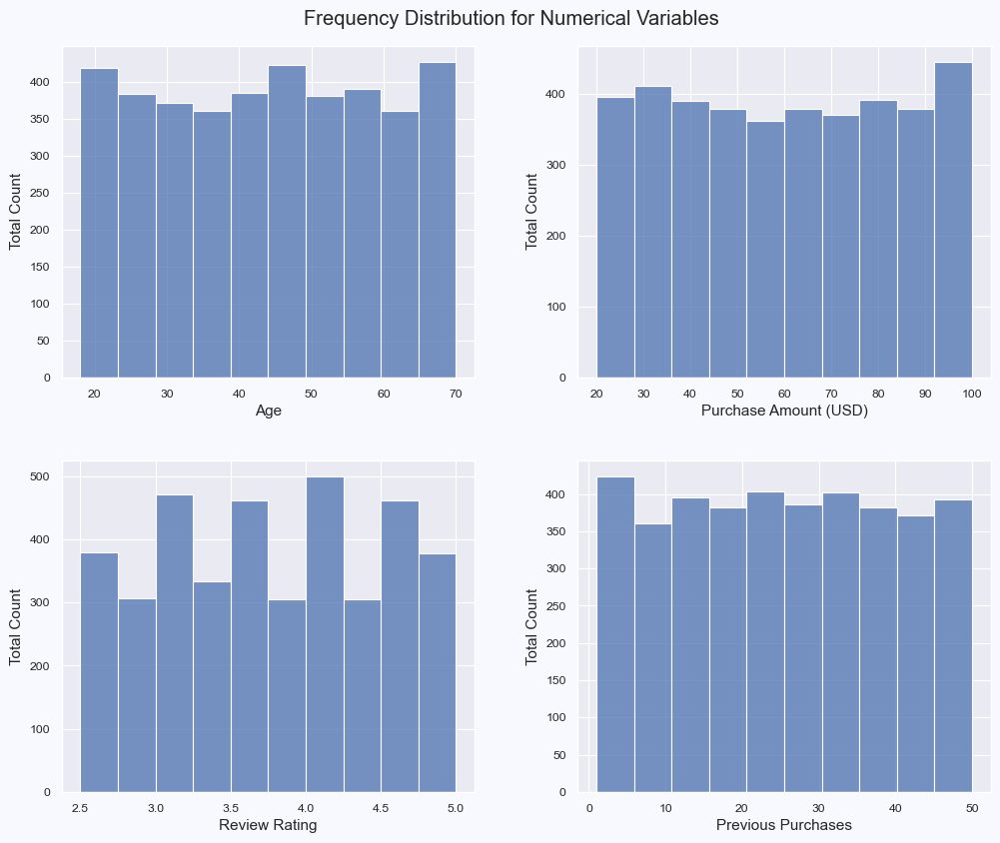

In [11]:
#Get statistical summary of the numerical data
display(df.describe().round(2).T, Markdown('<br>'))

#Show frequency distribution of numerical data using histogram
plt.figure(figsize=(12,9), facecolor='ghostwhite')
plt.suptitle('Frequency Distribution for Numerical Variables', fontsize=14.5)
plt.subplots_adjust(hspace=.25, wspace=.25, top=.94)
for i, col in enumerate(df.select_dtypes(exclude='object')):
    plt.subplot(2,2,i+1)
    ax=sns.histplot(data=df, x=col, bins=10, color='#4C72B0')
    ax.set_xlabel(str(col), fontsize=11)
    ax.set_ylabel('Total Count', fontsize=11)
plt.show()


<div style="font-family: Arial; font-size: 11pt; line-height:1.5">
As depicted here, most of the data exhibit uniform distribution with no skewness in either direction. Further, based on the statistical summary table, the ages of customers in the dataset range from 18 to 70 years old, with a mean of 44 years. Noteworthy also, all the purchases made range from about 20 USD to 100 USD with a mean of 60 USD. Lastly, the observed ratings fall on a 5-star rating scale with an average of 3.7 stars. Now, I will review non-numeric data.</div><br>
<br>

**Categorical Data**

,count,unique,top,freq
Age Group,3900,6,46-55,753
Gender,3900,2,Male,2652
Item Purchased,3900,25,Blouse,171
Category,3900,4,Clothing,1737
Location,3900,50,Montana,96
Region,3900,8,Southeast,947
Size,3900,4,M,1755
Color,3900,25,Olive,177
Season,3900,4,Spring,999
Subscription Status,3900,2,No,2847


<br><br>

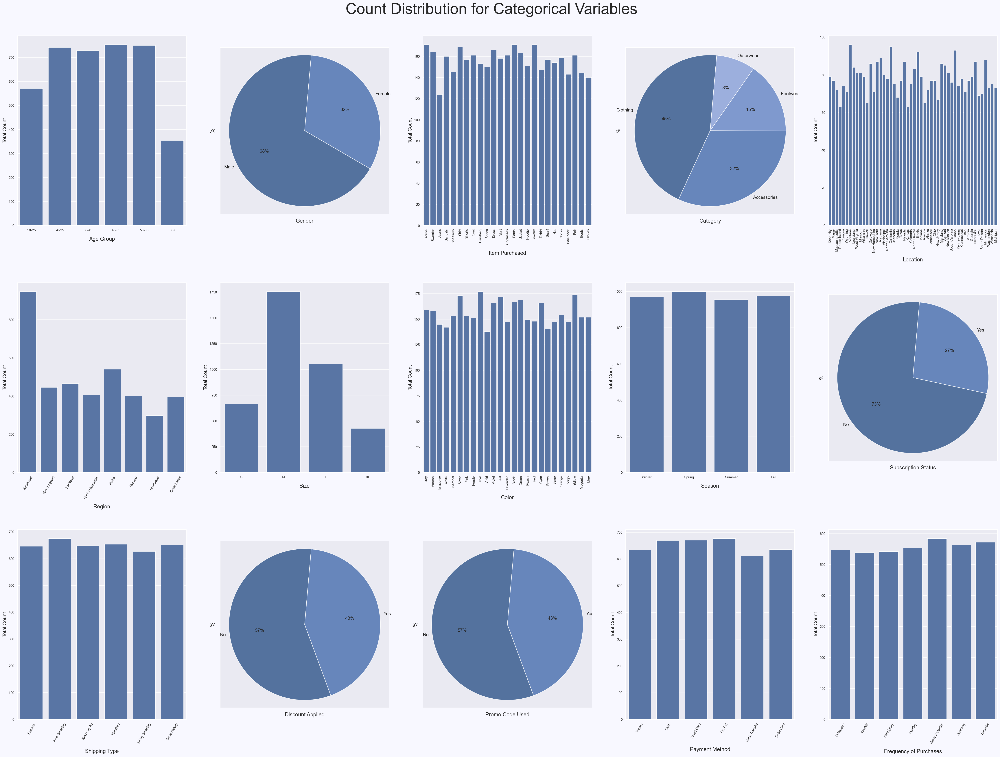

In [12]:
#Get statistical summary of non-numeric (categorical) data 
display(df.describe(include='object').T, Markdown('<br><br>'))

#Show distribution of categorical data
n_rows, n_cols = 3,5
plt.figure(figsize=(46,30), facecolor='ghostwhite', dpi=150)
plt.suptitle('Count Distribution for Categorical Variables', fontsize=40)
plt.subplots_adjust(hspace=.3, top=.94)
for i,col in enumerate(df.select_dtypes(include='object').columns):
    order_dict = {'Age Group': age_labels, 'Size': ['S', 'M', 'L', 'XL'], 'Season': ['Winter', 'Spring', 'Summer', 'Fall'], 'Frequency of Purchases': ['Bi-Weekly', 'Weekly', 'Fortnightly', 'Monthly', 'Every 3 Months', 'Quarterly', 'Annually']}
    plt.subplot(n_rows, n_cols, i+1)
    if len(df[col].unique())==2 or col=='Category':
        ax=plt.gca()
        ax.pie(df[col].value_counts(), labels=df[col].value_counts().index, autopct='%1.0f%%', labeldistance=1.05, startangle=85, colors=['#355A8D', '#4C72B0', '#6A89C7', '#8CA3D9'], frame=True, wedgeprops=dict(linewidth=1.2, alpha=.83), textprops=dict(fontsize=12))
        ax.patch.set_facecolor((ax.get_facecolor(),0.95))
        ax.set_xlabel(str(col), fontsize=14, labelpad=12)
        ax.set_ylabel('%', fontsize=15, labelpad=12)
        ax.set_xlim(xmin=-1.115, xmax=1.115)
        ax.set_ylim(ymin=-1.1, ymax=1.1)
        ax.set(xticks=[], yticks=[])
    else:
        ax=sns.countplot(x=df[col], color='#4C72B0', order=order_dict.get(col, None))
        ax.set_xticklabels(ax.get_xticklabels(), rotation=(0 if (len(np.unique(df[col])) <= 4 or col=='Age Group') else 60 if (4 < len(np.unique(df[col])) < 10) else 90))
        ax.set_xlabel(str(col), fontsize=14, labelpad=12)
        ax.set_ylabel('Total Count', fontsize=13)
plt.show()


<div style="font-family: Arial; font-size: 11pt; line-height:1.5">
Notable here, as demonstrated by both the statistical summary table and the graphs, most of the customers in the current data are Southeastern, middle-aged males, with males making up around two-thirds of the sample; most of the purchases are clothing items; and most customers are not subscribers of the shop or brand in question. For most of the remaining variables, we once again finding them exhibiting uniform distribution with little variation between their different categories. Now I will explore the data more closely by performing bivariate analysis to uncover the relationships between the features in the data. <br> </div>
<br>

### Bivariate Analysis
<div style="font-family: Arial; font-size: 11pt; line-height:1.5">
For this part of the analysis, I will pick up the features that seem most important or relevant for the current task and analyze them in relation to each other and other features that may be relevant. Accordingly, I will analyze the dataset by gender, age group, purchase amount, purchase frequency, and region.
</div>    
<br>

**Bivariate Analysis by Gender**

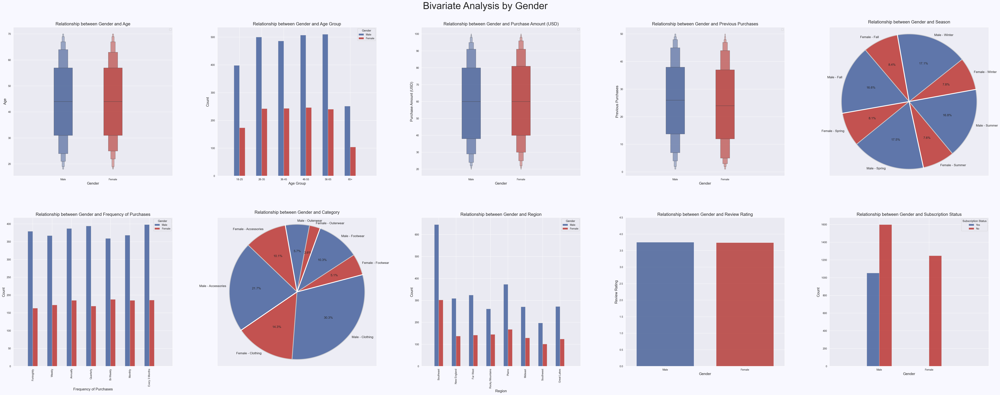

In [13]:
#Define target variable and features to compare it to 
target = ['Gender']
features = ['Age', 'Age Group', 'Purchase Amount (USD)', 'Previous Purchases', 'Season', 'Frequency of Purchases', 'Category', 'Region',  'Review Rating', 'Subscription Status']

#Analyze data and plot results 
Get_Plots(features, target, colors=['#3b5998', '#b92b27'], order={'Age Group': age_labels}, pie=True, n_rows=2, n_cols=5)


<div style="font-family: Arial; font-size: 11pt; line-height:1.5">
Performing bivariate analysis by gender, we once again observe a higher number of male customers than female customers overall across all measures, however, beside the number of customers, we can see no notable differences between male and female customers across almost all of the variables analyzed, including age, spending capacity (purchase amounts), number of previous purchases, average rating scores, and region. Most customers, whether males or females, are adults to seniors, they tend to spend around 40 to 80 dollars per purchase, they shop consistently across the year, mostly shopping for clothes followed by accessories, they have equivalent satisfaction levels, judging by review rating scores, and the highest number of customers, both males and females, are concentrated in the Southeast. Where male and female customers evidently differ most drastically is when it comes to subscription status: most, or perhaps all, subscribers to the brand or shop services tend to be males rather than females. Thus, subscribed customers tend to be exclusively males.
</div>

<br>

**Bivariate Analysis by Age Group**

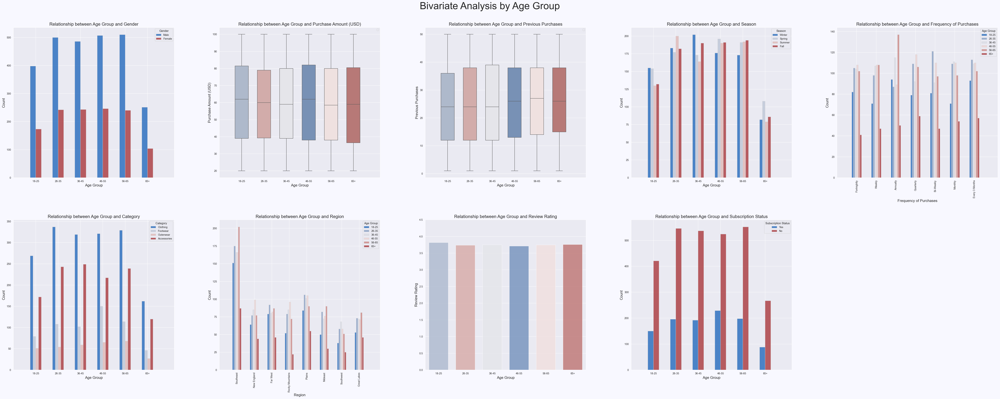

In [14]:
#Define target and relevant features
target = ['Age Group']
features = ['Gender', 'Purchase Amount (USD)', 'Previous Purchases', 'Season', 'Frequency of Purchases', 'Category', 'Region', 'Review Rating', 'Subscription Status']

#Analyze data and plot results 
Get_Plots(features, target, colors='vlag', order={'Age Group': age_labels}, boxen=False, n_rows=2, n_cols=5)


<div style="font-family: Arial; font-size: 11pt; line-height:1.5">
Moving to bivariate analysis by age group, we don't find much variation between the different age gcohorts in relation to most of the variables considered, at least nothing that univariate analysis of age groups alone did not reveal. Where age group seem to be most impactful or relevant is in relation to shopping frequency, region, and to a lesser degree subscription status. <br> First, at one extreme, those who tend to shop most frequently, twice a week, tend to be predominantly adults aged 26 to 35 years old followed by older adults aged 45 to 55 years old, whereas, at the other extreme, those who tend to shop least frequently, annually, tend to be mostly seniors aged 56 to 65 years old followed by middle-aged adults (36-45 years old). Second, age cohort seem to be relevant to shopping behavior in relation to region. Most notably, customers in the Southeast, the region with the highest number of customers, tend to be predominantly seniors aged 56-65 years followed by adults aged 26 to 35. This also the case, however to a comparatively lesser degree, in the Mideast. We also find notable differences the Rocky Mountains region, New England, and the Plains. Across these 3 regions, middle aged adults (46-55 years) tend to be overrepresented (except for the Plains where they compete for the top spot with adults (26-35 years)). More generally, the age group least engaged across all regions is the elderly aged 65 and above followed by young adults (18-25 years). Lastly, age might likely play a role in subscription rates. Particularly, most subscribers to the brand or shop services tend to be middle-aged adults and the least group of subscribers tend to be the elderly. 
</div>

<br>

**Bivariate Analysis by Purchase Amount**

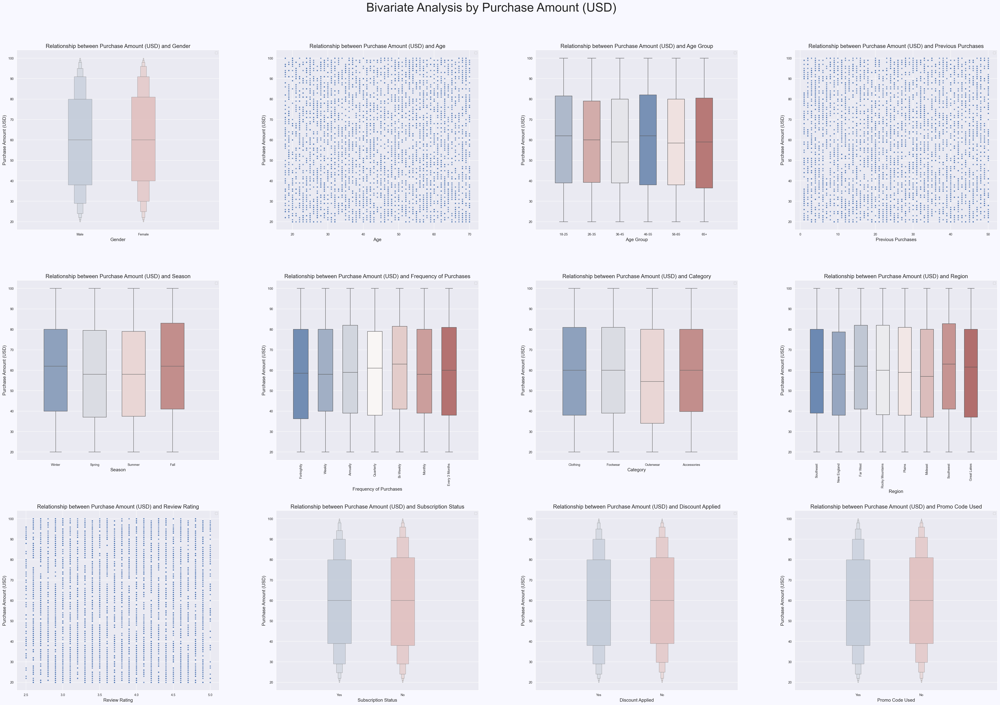

In [15]:
#Define target and relevant features
target = ['Purchase Amount (USD)']
features = ['Gender', 'Age', 'Age Group', 'Previous Purchases', 'Season', 'Frequency of Purchases', 'Category', 'Region', 'Review Rating', 'Subscription Status',  'Discount Applied', 'Promo Code Used']

#Analyze data and plot results 
Get_Plots(features, target, colors='vlag', order={'Age Group': age_labels}, boxen=False)


<div style="font-family: Arial; font-size: 11pt; line-height:1.5">
Analyzing by Purchase Amount (per purchase), we find general uniformity across most variables. Customers do not differ much in purchasing capacity or spending amounts based on gender or age, previous experience, frequency of purchase, time of season or region, among many others. What's perhaps most odd or paradoxical here is that customers' spendings also do not differ based on subscription status, with the application of a discount or the use of promo codes, which seem to suggest that these benefits or services are merely symbolic rather than offering a real advantage. All in all, across the different dimensions, customers tend to spend mostly between 40 and 80 dollars on a given purchase with a median purchase amount of 60 dollars.
</div>

<br>

**Bivariate Analysis by Frequency of Purchases**

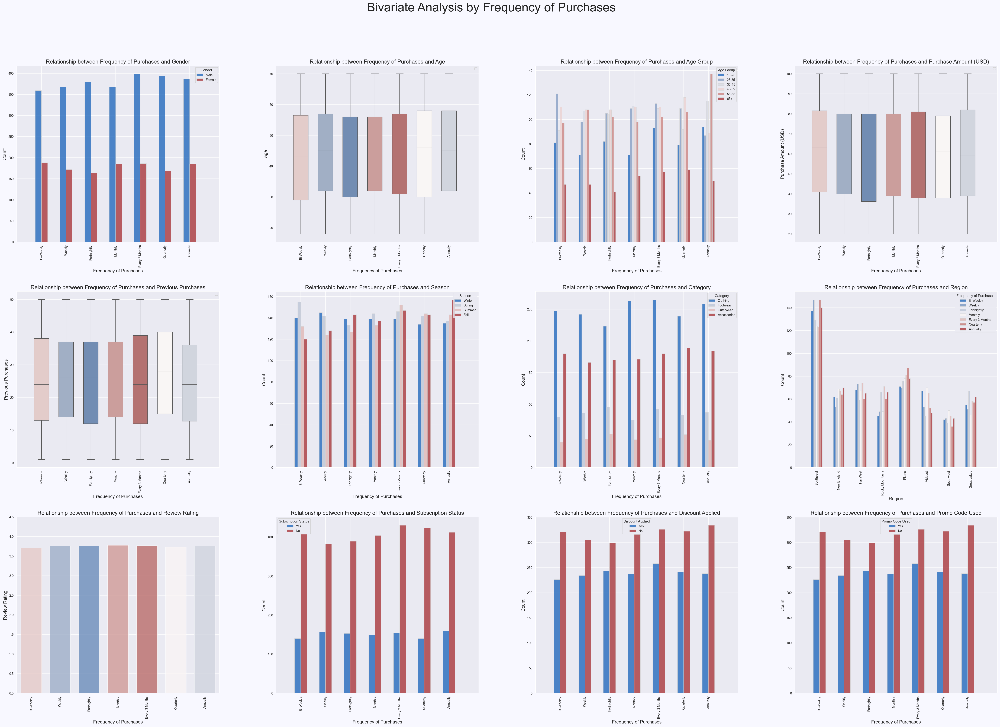

In [16]:
#Define target and relevant features
target = ['Frequency of Purchases']
features = ['Gender', 'Age', 'Age Group', 'Purchase Amount (USD)', 'Previous Purchases', 'Season', 'Frequency of Purchases', 'Category', 'Region', 'Review Rating', 'Subscription Status',  'Discount Applied', 'Promo Code Used']

#Analyze data and plot results 
order_dict = {'Age Group': age_labels, 'Frequency of Purchases': ['Bi-Weekly', 'Weekly', 'Fortnightly', 'Monthly', 'Every 3 Months', 'Quarterly', 'Annually']}
Get_Plots(features, target, colors='vlag', order=order_dict, boxen=False)


<div style="font-family: Arial; font-size: 11pt; line-height:1.5">
Analyzing by Frequency of Purchase, we once again find a general unifromity across the different variables. Males are overrepresented across all purchasing frequency groups compared to females; frequency of purchase doesn't seem to vary much with spending capacity or purchase history, season or the category of the item purchased. Also, oddly enough the frequency of purchase also does not seem to be influenced much by subscription status or the presence of discounts and promo codes, which again may be reflective of their symbolic nature. <br> 
Where frequency of purchase tends to vary relatively more prominent is in relation to age group and local region, albeit to a lesser degree. Although examining by age in absolute terms does not reveal much difference, analyzing by age cohorts, as discussed earlier, we get a more nuanced picture. First, customers who tend to shop most frequently, i.e. twice a week, tend to be mostly adults aged 26 to 35 years, and they remain a prominent customers group across all other shopping frequencies. Conversely, customers who tend to shop least frequently, i.e. annually, tend to be mostly seniors aged 56 to 65 years. More generally, younger adults tend to shop mostly every 3 months or annually, followed by as frequently as twice a week or once every two weeks (fortnightly), however they make up a smaller customer base overall, only next to last to the elderly group aged 65 and above. <br> The second slightly notable finding has to do with region. Particularly, customers in the Southeast, the region with the highest number of customers, tend to shop either very frequently, once a week, or quarterly (once every 4 months), but they do less so monthly or every 3 months. Moving to the Plains, customers mostly shop once every 4 months or once every 3 months but less so weekly or bi-weekly. The Mideast customers tend to shop mostly very frequently, twice a week, or once every 3 months. Customers in the Rocky Mountains region are also mostly engaged once every 3 months, but they are the least engaged in frequent shopping. And lastly, customers in the Great Lakes tend to shop mostly once every 2 weeks. There are no notable differences in terms of shopping frequency for the remaining regions.
</div>

<br>

**Bivariate Analysis by Region**

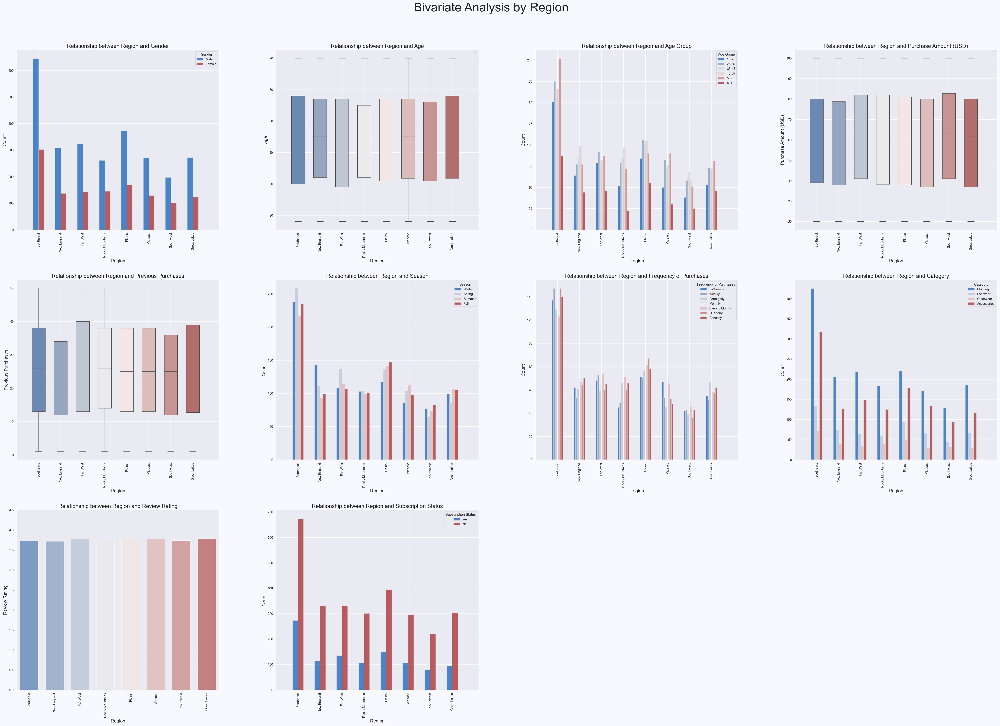

In [17]:
#Define target and relevant features
target = ['Region']
features = ['Gender', 'Age', 'Age Group', 'Purchase Amount (USD)', 'Previous Purchases', 'Season', 'Frequency of Purchases', 'Category', 'Review Rating', 'Subscription Status']

#Analyze data and plot results 
order_dict = {'Age Group': age_labels, 'Frequency of Purchases': ['Bi-Weekly', 'Weekly', 'Fortnightly', 'Monthly', 'Every 3 Months', 'Quarterly', 'Annually']}
Get_Plots(features, target, colors='vlag', order=order_dict, boxen=False)


<div style="font-family: Arial; font-size: 11pt; line-height:1.5">
Finally, bivariate analysis by region, the last variable considered here, reveals a number of interesting relationship between shopping habits and local region. The first notable relationship among them is between region and age group, which I have discussed at length earlier. As mentioned, customers in the Southeast and the Mideast  tend to be mostly seniors or adults. In each of New England and the Rocky Mountains, we find that most customers tend to be middle-aged adults. We also find the same in the Plains, however middle-aged adults seem to compete with adults over the most represented age cohort in this region. Consistent across all regions, we find the least engaged customers to be the elderly followed by young adults. <br>
We also find some relationship between region and frequency of purchase. Again as discussed earlier, customers in the Southeast tend to shop either very frequently, i.e. weekly, or quarterly; thus the Southeast seem to be divided into a group of very frequent buyers and other more seasonal buyers. We also see something similar in the Mideast and the Rocky Mountains, with most customers being either very frequent buyers, shopping as frequently as twice a week, or less frequent buyers, shopping mostly once every 3 months. Other regions, as with the Plains, features customers who are mostly seasonal shoppers only, shopping mostly once every 4 or 3 months, others, particularly the Great Lakes, feature customers who are mostly frequent buyers, shopping mostly once every 2 weeks. No significant differences are observable for the remaining three regions. <br>
Lastly, we find a relationship for some of the regions and shopping season. More particularly, customers in the Southeast tend to engage in shopping activity slightly more in the winter but engage least in the summer. Customers in New England engage in shopping activity significantly more in the winter compared to all other seasons. Customers in the Far West engage most in the Spring compared to other seasons. And, finishing with the last region that seems to have a notable relationship with season, customers in the Plains tend to shop most in the Fall and least in Winter. 
</div>
<br>



<div style="font-family: Arial; font-size: 11pt; line-height:1.5">
Now that we have familiarized ourselves with the data, establishing a better overview and developing a rough idea about what to expect, I will proceed with the necessary data preprataions and subsequent model development for clustering and customer segmentation.
</div>

<br>

<a id="data-preprocessing"></a>

## Part Four: Data Preprocessing 

<div style="font-family: Arial; font-size: 10.5pt; line-height:1.5">
<b>In preparation for model development to perform cluster analysis and segment customers, in this section I will follow the necessary data transformation procedures to make the data viable for modeling and numerical analysis. As most of the variables in the data are categorical, first I have to convert these categorical data to numeric-type data to be able to analyze them. Accordingly, I will first perform One-Hot Encoding to convert the categorical data to numeric ones suitable for analysis. Second, I will perform feature scaling to ensure that all the variables in the dataset are represented on the same scale or data range, from 0 to 1, and thereby ensure that the dataset is modeled accurately.</b>
</div>
<br>

**Dealing with Categorical Variables: One-Hot Encoding** <br>

First, I will identify the categorical variables in the data and then perform one-hot encoding on them to covert their categorical values to  numeric-type values that can be viable for numerical analysis and modeling. This method involves creating new binary categories for each of the unique values in a given categorical variable, assigning 1 to signify its presence or 0 to signify its absence.


In [18]:
#Identify categorical variables
categorical_cols = df.select_dtypes(include='object').columns

#Now we can perform one-hot encoding on the identified columns
#Create encoder object 
OHE_encoder = OneHotEncoder(handle_unknown='ignore')

#Perform One-Hot encoding and return new dataframe with the variables encoded
df_encoded_vars = pd.DataFrame(OHE_encoder.fit_transform(df[categorical_cols]).toarray())
df_encoded_vars.columns = OHE_encoder.get_feature_names_out(categorical_cols)

#Create new dataframe joining the new encoded categories with the earlier numerical variables
df_encoded = pd.concat([df.drop(categorical_cols,axis=1), df_encoded_vars], axis=1)

#Examine dataframe shape after encoding
print('Number of coloumns:', df_encoded.shape[1])
print('Number of rows:', df_encoded.shape[0])
print()

#preview head of the new dataframe 
df_encoded.head()


Number of coloumns: 157
Number of rows: 3900



,Age,Purchase Amount (USD),Review Rating,Previous Purchases,Age Group_18-25,Age Group_26-35,Age Group_36-45,Age Group_46-55,Age Group_56-65,Age Group_65+,Gender_Female,Gender_Male,Item Purchased_Backpack,Item Purchased_Belt,Item Purchased_Blouse,Item Purchased_Boots,Item Purchased_Coat,Item Purchased_Dress,Item Purchased_Gloves,Item Purchased_Handbag,Item Purchased_Hat,Item Purchased_Hoodie,Item Purchased_Jacket,Item Purchased_Jeans,Item Purchased_Jewelry,Item Purchased_Pants,Item Purchased_Sandals,Item Purchased_Scarf,Item Purchased_Shirt,Item Purchased_Shoes,Item Purchased_Shorts,Item Purchased_Skirt,Item Purchased_Sneakers,Item Purchased_Socks,Item Purchased_Sunglasses,Item Purchased_Sweater,Item Purchased_T-shirt,Category_Accessories,Category_Clothing,Category_Footwear,Category_Outerwear,Location_Alabama,Location_Alaska,Location_Arizona,Location_Arkansas,Location_California,Location_Colorado,Location_Connecticut,Location_Delaware,Location_Florida,Location_Georgia,Location_Hawaii,Location_Idaho,Location_Illinois,Location_Indiana,Location_Iowa,Location_Kansas,Location_Kentucky,Location_Louisiana,Location_Maine,Location_Maryland,Location_Massachusetts,Location_Michigan,Location_Minnesota,Location_Mississippi,Location_Missouri,Location_Montana,Location_Nebraska,Location_Nevada,Location_New Hampshire,Location_New Jersey,Location_New Mexico,Location_New York,Location_North Carolina,Location_North Dakota,Location_Ohio,Location_Oklahoma,Location_Oregon,Location_Pennsylvania,Location_Rhode Island,Location_South Carolina,Location_South Dakota,Location_Tennessee,Location_Texas,Location_Utah,Location_Vermont,Location_Virginia,Location_Washington,Location_West Virginia,Location_Wisconsin,Location_Wyoming,Region_Far West,Region_Great Lakes,Region_Mideast,Region_New England,Region_Plains,Region_Rocky Mountains,Region_Southeast,Region_Southwest,Size_L,Size_M,Size_S,Size_XL,Color_Beige,Color_Black,Color_Blue,Color_Brown,Color_Charcoal,Color_Cyan,Color_Gold,Color_Gray,Color_Green,Color_Indigo,Color_Lavender,Color_Magenta,Color_Maroon,Color_Olive,Color_Orange,Color_Peach,Color_Pink,Color_Purple,Color_Red,Color_Silver,Color_Teal,Color_Turquoise,Color_Violet,Color_White,Color_Yellow,Season_Fall,Season_Spring,Season_Summer,Season_Winter,Subscription Status_No,Subscription Status_Yes,Shipping Type_2-Day Shipping,Shipping Type_Express,Shipping Type_Free Shipping,Shipping Type_Next Day Air,Shipping Type_Standard,Shipping Type_Store Pickup,Discount Applied_No,Discount Applied_Yes,Promo Code Used_No,Promo Code Used_Yes,Payment Method_Bank Transfer,Payment Method_Cash,Payment Method_Credit Card,Payment Method_Debit Card,Payment Method_PayPal,Payment Method_Venmo,Frequency of Purchases_Annually,Frequency of Purchases_Bi-Weekly,Frequency of Purchases_Every 3 Months,Frequency of Purchases_Fortnightly,Frequency of Purchases_Monthly,Frequency of Purchases_Quarterly,Frequency of Purchases_Weekly
0,55,53,3.1,14,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,19,64,3.1,2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,

**Feature Scaling** <br>

Now given that the different features in the data exist on different scales of different sizes, I will perform feature nomralization  to normalize o  redistribute the features' values to be represented on the same scale of 0 to 1.

In [19]:
#Create scaler object
scaler = MinMaxScaler()

#Perform feature normalization 
df_encoded = scaler.fit_transform(df_encoded)

#Now we can look at the value distribution of data after rescaling 
stats_table = pd.DataFrame(df_encoded, columns=scaler.get_feature_names_out()).describe(percentiles=[]).round(1).T
stats_table


,count,mean,std,min,50%,max
Age,3900.0,0.5,0.3,0.0,0.5,1.0
Purchase Amount (USD),3900.0,0.5,0.3,0.0,0.5,1.0
Review Rating,3900.0,0.5,0.3,0.0,0.5,1.0
Previous Purchases,3900.0,0.5,0.3,0.0,0.5,1.0
Age Group_18-25,3900.0,0.1,0.4,0.0,0.0,1.0
...,...,...,...,...,...,...
Frequency of Purchases_Every 3 Months,3900.0,0.1,0.4,0.0,0.0,1.0
Frequency of Purchases_Fortnightly,3900.0,0.1,0.3,0.0,0.0,1.0
Frequency of Purchases_Monthly,3900.0,0.1,0.3,0.0,0.0,1.0
Frequency of Purchases_Quarterly,3900.0,0.1,0.4,0.0,0.0,1.0


<br>

<a id="model-development-and-evaluation-(cluster-analysis)"></a>

## Part Five: Model Development and Evaluation (Cluster Analysis)

<div style="font-family: Arial; font-size: 10.5pt; line-height:1.5">
<b>In this section, I will develop different clustering algorithms, tune and optimize each, and compare them together to obtain the model with the best clustering performance. As such, I will test out and compare four clustering models: K-Means, Hierarchical Agglomerative Clustering (HAC), Density-Based Spatial Clustering of Applications with Noise (DBSCAN), and Mean Shift (MS). For each of these four models, I will pick up the most relevant parameter for tuning to obtain the best clustering performance out of each. For K-Means, since it's the only algorithm that requires specifying the number of clustering in advance, I will test out different numbers of K clusters (1 to 10); for the HAC model, I will tune the distance threshold parameter which defines linkage distance threshold above which clusters will stop merging to obtain the final number of clusters; for the DBSCAN model, I will tune the epsilon distance parameter (eps) which defines the radius of each epsilon neighborhood (cluster) founded around the designated core points and according to which data points are clustered; and finally, for the Mean Shift model, I will tune the kernel bandwidth which determines the radius of the kernel used to compute data points densities, particularly by estimating the bandwidth size using sklearn's bandwidth estimator and setting a range of values around it. To assess and draw comparisons between the different algorithms, I will use two metrics: the silhouette score and the Davies Bouldin index (DBI) score. Both metrics provide useful insights into the quality of clustering and can be used to compare the different clustering algorithms or to choose the optimal number of clusters. The first metric, silhouette score, measures the degree of similarity between each data point relative to its cluster and tends to be particularly useful for assessing the overall quality of clustering, while the second metric, DBI score, evaluates the quality of separation after clustering by measuring the average similarity ratio of each cluster with its most similar cluster and thus tends to be most useful for assessing the separation between clusters. Values closer to zero on each metric should indicate better clustering results. The best performing clustering algorithm will be chosen for clustering and analyzing the data.</b>
</div>
<br>

**Model development, tuning, and evaluation**

In [20]:
#Define clustering algorithms to test 
estimators_lst = [('K-Means', KMeans(init='k-means++', n_init=10, random_state=42)), 
              ('HAC', AgglomerativeClustering(n_clusters=None, metric='euclidean', linkage='ward', compute_full_tree=True)), 
              ('DBSCAN', DBSCAN(min_samples=50, n_jobs=-1)), 
              ('MS', MeanShift(cluster_all=False, n_jobs=-1))]

#Define parameters to tune for each separate algorithm
bandw = estimate_bandwidth(df_encoded, quantile=.3) 
params_lst = [('n_clusters', np.arange(1,11)),
            ('distance_threshold', np.linspace(20,100,9)),
            ('eps', np.arange(0.1, 1.1, 0.1)),
            ('bandwidth', np.linspace(bandw-1, bandw+1, 10))]

#Create empty table to store tuning results per model
models_results = []

#Loop over each model, optimize and evaluate it and store results
for estimator, params in zip(estimators_lst,params_lst):
    for param in params[1]:
        #Set current parameter value and fit the model
        estimator[1].set_params(**{params[0]: param})
        estimator[1].fit(df_encoded)
        #get model clusters
        clusters = estimator[1].labels_
        
        #compute Silhouette and DBI scores        
        try:
            silhouette = round(silhouette_score(df_encoded, clusters),3)
            davies_bouldin = round(davies_bouldin_score(df_encoded, clusters),3)
        except:
            silhouette, davies_bouldin = np.nan, np.nan
        
        #store model results
        models_results.append({'Model': estimator[0], 'n_clusters': len(np.unique(clusters)), 
                        params[0]: round(param,2), 'silhouette score': silhouette, 'DBI score': davies_bouldin })

#Convert results to dataframe
results_df = pd.DataFrame(models_results).sort_values(['Model','n_clusters']).set_index(keys=['Model', 'n_clusters'])

#report evaluation results by silhouette and DBI score
display(results_df[['silhouette score','DBI score']].drop_duplicates(keep='last'))


silhouette score  DBI score
Model   n_clusters                             
HAC     2                      0.112      2.732
        3                      0.058      5.042
        9                      0.018      5.372
K-Means 2                      0.113      2.718
        3                      0.068      3.851
        4                      0.049      4.344
        5                      0.041      4.434
        6                      0.043      4.604
        7                      0.037      4.639
        8                      0.040      4.513
        9                      0.038      4.520
        10                     0.035      4.465
MS      1                        NaN        NaN
        2                      0.070      3.258

**Model Comparison**


Parameter evaluation results for K-Means model:


silhouette score  DBI score
Model   n_clusters                             
K-Means 1                        NaN        NaN
        2                      0.113      2.718
        3                      0.068      3.851
        4                      0.049      4.344
        5                      0.041      4.434
        6                      0.043      4.604
        7                      0.037      4.639
        8                      0.040      4.513
        9                      0.038      4.520
        10                     0.035      4.465

<br>


Parameter evaluation results for HAC model:


distance_threshold  silhouette score  DBI score
Model n_clusters                                                 
HAC   2                         40.0             0.112      2.732
      2                         50.0             0.112      2.732
      2                         60.0             0.112      2.732
      2                         70.0             0.112      2.732
      2                         80.0             0.112      2.732
      2                         90.0             0.112      2.732
      2                        100.0             0.112      2.732
      3                         30.0             0.058      5.042
      9                         20.0             0.018      5.372

<br>


Parameter evaluation results for DBSCAN model:


eps  silhouette score  DBI score
Model  n_clusters                                  
DBSCAN 1           0.1               NaN        NaN
       1           0.2               NaN        NaN
       1           0.3               NaN        NaN
       1           0.4               NaN        NaN
       1           0.5               NaN        NaN
       1           0.6               NaN        NaN
       1           0.7               NaN        NaN
       1           0.8               NaN        NaN
       1           0.9               NaN        NaN
       1           1.0               NaN        NaN

<br>


Parameter evaluation results for MS model:


bandwidth  silhouette score  DBI score
Model n_clusters                                        
MS    1                3.76               NaN        NaN
      1                3.98               NaN        NaN
      1                4.20               NaN        NaN
      1                4.43               NaN        NaN
      1                4.65               NaN        NaN
      1                4.87               NaN        NaN
      1                5.09               NaN        NaN
      1                5.31               NaN        NaN
      1                5.54               NaN        NaN
      2                3.54              0.07      3.258

<br>

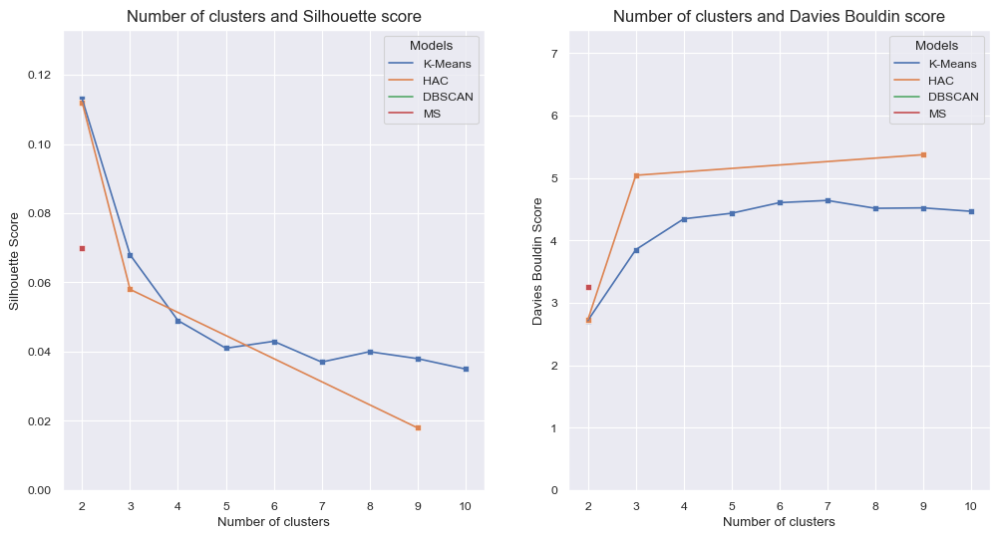

In [21]:
#Report and plot evaluation results for each model
fig, axes = plt.subplots(1,2, figsize=(12,6))
model_labels = ['K-Means', 'HAC', 'DBSCAN', 'MS']
for model,params in zip(model_labels,params_lst):
    cols = [params[0], 'silhouette score', 'DBI score']
    cols = [col for col in cols if col != 'n_clusters']
    model_res_df = results_df.iloc[results_df.index.get_level_values(0) == model][cols]
    
    #Report results table per model
    print(f'\nParameter evaluation results for {model} model:')
    display(model_res_df, Markdown('<br>'))
    
    #plot Silhouette scores per model
    ax1=sns.lineplot(data=model_res_df, x=model_res_df.index.get_level_values(1), y='silhouette score', ax=axes[0], label=model)
    sns.scatterplot(data=model_res_df, x=model_res_df.index.get_level_values(1), y='silhouette score', marker='s', ax=ax1)
    ax1.set_title('Number of clusters and Silhouette score',fontsize=12)
    ax1.set(xlabel='Number of clusters', ylabel='Silhouette Score')
    ax1.set_ylim(0, results_df['silhouette score'].max()+.02)
    ax1.legend(loc='upper right', title='Models')
    
    #plot DBI scores per model 
    ax2=sns.lineplot(data=model_res_df, x=model_res_df.index.get_level_values(1), y='DBI score', ax=axes[1], label=model)
    sns.scatterplot(data=model_res_df, x=model_res_df.index.get_level_values(1), y='DBI score', marker='s', ax=ax2)
    ax2.set_title('Number of clusters and Davies Bouldin score', fontsize=12)
    ax2.set(xlabel='Number of clusters', ylabel='Davies Bouldin Score')
    ax2.set_ylim(0, results_df['DBI score'].max()+2)
    ax2.legend(loc='upper right', title='Models')


 <br>

<div style="font-family: Arial; font-size: 11pt; line-height:1.5">
As depicted by the result tables and graphs above, except for the DBSCAN model which failed to segment customers and obtain any clusters, the three other models found at least 2 clusters in the data. Particularly, the Mean Shift model found only 2 clusters in the data, whereas the K-Means and HAC models managed to obtain two and more customer clusters. Looking at the Silhouette scores, which as mentioned evaluates the degree of similarity between each data point and its cluster, the scores for each of the models start pretty low (i.e., closer to 0 than 1), around 0.1 and lower, which indicates a good clustering performance overall for 2 clusters, with the lowest silhouette score being associated with the Mean Shift model (silhouette score = 0.07). However, if we are to go further than 2 clusters, just as a safe measure, we can see a sharp decrease in the silhouette scores from 2 clusters to 3 clusters for the two models that obtained more than 2: K-Means and HAC. Both start out with a silhouette score of around 0.11 at 2 clusters, and then decrease sharply down to around 0.06 at 3 clusters, with the HAC model obtaining a slightly lower score. No sharper decrease is observed with greater numbers of clusters. Now, while this gives a slight advantage to the HAC model, looking the Davies-Bouldin scores at 3 clusters, we find the K-Means model to be the better performing one, acheiving a DBI score of 4, relative to DBI=5 for the HAC model. Thus, combining the two metrics together, we can conclude that the best clustering algorithm for the data is the K-Means model with 3 clusters. As such, I will now train a K-Means model with 3 clusters to be the final model for the data before proceeding with the analysis in relation to the three obtained clusters. </div><br>
<br>


**Final Model Selection: K-Means Clustering (n_clusters = 3)**

In [22]:
#Create k-means object with 3 clusters
Kmeans = KMeans(n_clusters=3, init='k-means++', n_init=10, random_state=42)

#Fit the K-means model
Kmeans_model = Kmeans.fit(df_encoded)

#Obtain cluster labels and add them to dataframe
df['KM Clusters'] = Kmeans_model.labels_
df['KM Clusters'] = pd.Categorical(df['KM Clusters'].map({0: 'Cluster 1', 1: 'Cluster 2', 2: 'Cluster 3'}))

#Preview sample of the dataframe 
df.sample(5)

,Age,Age Group,Gender,Item Purchased,Category,Purchase Amount (USD),Location,Region,Size,Color,Season,Review Rating,Subscription Status,Shipping Type,Discount Applied,Promo Code Used,Previous Purchases,Payment Method,Frequency of Purchases,KM Clusters
3569,35,26-35,Female,Sandals,Footwear,94,Alaska,Far West,M,Olive,Fall,3.3,No,Express,No,No,9,Bank Transfer,Fortnightly,Cluster 3
360,51,46-55,Male,Pants,Clothing,30,Rhode Island,New England,M,Teal,Summer,3.0,Yes,Standard,Yes,Yes,18,Debit Card,Fortnightly,Cluster 2
3468,36,36-45,Female,Sunglasses,Accessories,89,Ohio,Great Lakes,S,Indigo,Winter,3.5,No,Standard,No,No,36,Debit Card,Quarterly,Cluster 3
3390,32,26-35,Female,Socks,Clothing,70,Oregon,Far West,S,Red,Summer,3.0,No,Next Day Air,No,No,38,PayPal,Annually,Cluster 3
3238,25,18-25,Female,Sneakers,Footwear,84,Wyoming,Rocky Mountains,XL,Teal,Fall,3.4,No,2-Day Shipping,No,No,37,Cash,Quarterly,Cluster 3


<br>

<a id="model-interpretation"></a>

## Part Six: Model Interpretation 

<div style="font-family: Arial; font-size: 10.5pt; line-height:1.5">
<b>In this section, I will concentrate on analyzing the obtained clusters in relation to the rest of the dataset. First, I will perform bivariate analysis to breakdown the clusters by each of the important or relevant features in the dataset and thereby understand their characteristics and implications in depth. Then, in order to add more nuance to our understanding of the clusters, I will compare pairs of variables together and in relation to the customer clusters (for instance, examining the spending capacity of each age group and how these interactions map onto the 3 customer clusters), which, as such, will effectively culminate in multivariate analysis: testing pairs of variables in relation to a third variable, customer clusters, for a multitude of pairs of variables. Based on the analysis results, I will write up a report describing the 3 clusters in detail, identifying their main characteristics or distinguishing features and delineating their main differences across the dataset.</b>
</div>
<br>

#### Cluster Analysis: Bivariate Analysis

<div style="font-family: Arial; font-size: 11pt; line-height:1.5">
In order to understand the 3 customer clusters obtained in detail, I will select and focus on the features in the data that seem most relevant or most informative. As such, I will examine the differences between the different customer groups across each of the following variables: gender, age, region, purchasing capacity, shopping frequency, previous purchases, season of the year, item category, subscription status, discount applied and promo code used. 
</div>

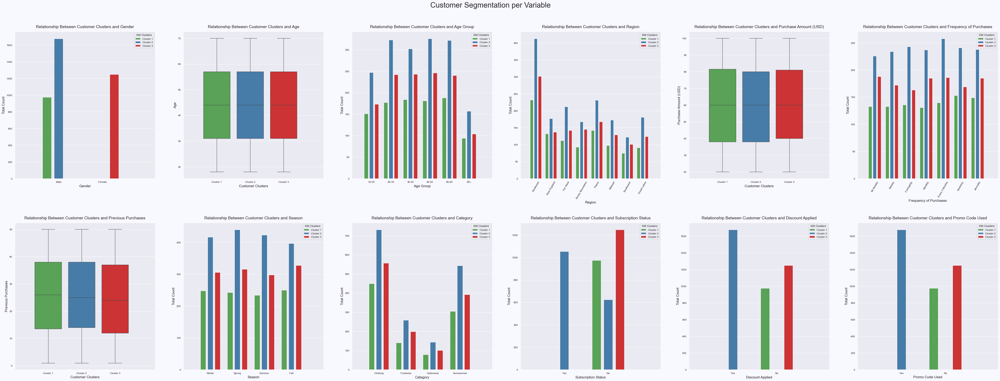

In [23]:
#Get colors for each cluster 
cluster_colors = plt.get_cmap('Set1_r').colors[-3:]    #green, blue, red

#Define relevant variables 
cols = ['Gender', 'Age', 'Age Group', 'Region', 'Purchase Amount (USD)', 'Frequency of Purchases', 
        'Previous Purchases', 'Season', 'Category', 'Subscription Status', 'Discount Applied', 'Promo Code Used']

#Plot customer segmentation by variable
fig, axes = plt.subplots(nrows=2, ncols=6, figsize=(60, 20), facecolor='ghostwhite')
plt.suptitle(f'Customer Segmentation per Variable', fontsize=25)
plt.subplots_adjust(wspace=.2, hspace=.3, top=.91)
for i,col in enumerate(cols):
    ax = axes[i // 6, i % 6]
    if df[col].dtype != 'object':
        sns.boxplot(data=df, x='KM Clusters', y=col, palette=cluster_colors, ax=ax)
        ax.set_title(f'Relationship Between Customer Clusters and {col}', fontsize=14, pad=12)
        ax.set_xlabel('Customer Clusters', fontsize=12, labelpad=5)
        ax.set_xlim(-1,len(ax.get_xticklabels())+0.2) 
        ax.set_ylabel(col, fontsize=12)
    else:  
        sns.countplot(data=df, x=col, hue='KM Clusters', order=order_dict.get(col, None), palette=cluster_colors, gap=.25, ax=ax)
        ax.set_title(f'Relationship Between Customer Clusters and {col}', fontsize=14, pad=12)
        ax.set_xlabel(col, fontsize=12, labelpad=5)
        ax.set_xlim(-1,len(ax.get_xticklabels())+0.2) 
        ax.set_xticks(ticks=ax.get_xticks(), labels=ax.get_xticklabels(), rotation=(0 if (len(ax.get_xticklabels()) <= 4 or col=='Age Group') else 60 if (4 < len(ax.get_xticklabels()) < 10) else 90))
        ax.set_ylabel('Total Count', fontsize=12)
plt.show()


<br>


#### **Results:**

<div style="font-family: Arial; font-size: 12pt;font-weight:bold">
    Based on the cluster analysis above, we can see 3 distinct customer groups emerging from the data:
</div> <br>

<div style="font-family: Arial; font-size: 11pt; line-height:1.7">

&ensp; **Group 1 (Green):** 
- This group of customers tends be male only, with ages distributed across the board but peaking slightly in adulthood (26-35 years) and remaining consistent till seniority (56-65 years). <br>
- They tend to be least frequent buyers, mostly shopping shopping once every 4 months (quarterly) or annually. <br>
- They are not subscribers of the service and and seldom enjoy any benefits such as discounts or promo codes. <br>

<br>

&ensp; **Group 2 (Blue):**
- This second customer group also tends to be male dominated and made up mostly of adults, middle-aged adults and seniors, but nonetheless also varying in age as much as the former group. <br>
- They tend to be the most frequent buyers. Their shopping is consistently high across the year and compared to other customer groups, and most customers in that group shop every 3 months followed by as frequent as every two weeks. <br>
- Consistent with this picture, they also tend to be the only customer group that are subscribers of the shop and the only group of customers that tend to enjoy benefit such discounts and promo codes, persumably as a result of their subscription status. In fact, they nearly always shop only if a discount or promo code is avaliable. So it is likely that the benefits they reap from subscribing to the service is what keeps them avid customers across the year. <br>

<br>

&ensp; **Group 3 (Red):**
- The last customer group is made up of females only, with again ages distributed across the board but slightly concentrated around middle adulthood. <br>
- They are the second most frequent buyers. Their shopping is consistent across the year, however they mostly shop twice a week, monthly, every three months, and annually. Compared to other groups, within-group analysis shows that this group of females tend to shop more frequently overall compared to the two other groups which tend to shop relatively more sparesly, especially compared to the first male group of casual shoppers. <br>
- Like group 1, this group too are almost never subscribers of the service and do not enjoy any benefits like discounts or promo codes. <br>

<br>

&ensp; **Common to all three groups:**
- The three groups do not differ in age or spending capacity. The finding that the 3 clusters of customers are near identical in age distribution and slightly peaking around middle adulthood might be persumably due to older adults having higher earning and thus spending capacity compared to younger adults. And arguably they also tend to be more outgoing than the elderly which explains the other end of the extreme. <br>
- Analyzing purchasing behavior by season, all three groups' shopping activity tend to be generally consistent across the year with very little variation between groups beyond the typically seen frequency of purchase. Perhaps the only notable difference is that males in the first customer group and females making up the third customer group tend to shop slightly more in the fall season, whereas the second group of frequent male customers shop more across the three other seasons. This could arguably be due to the fact that the loyal male customers group is the only group that is subscribed to the brand services and persumably enjoy discounts and offers across the year as a result, whereas the other two groups don't, in which case they'd be shopping relatively more during the fall season which typically involves lots discounts and great shopping opportunities especially during the month of November with annual retail phenomenon like Black Friday. <br>
- There are also no drastic differences between the 3 clusters in terms of the category of the items being purchased, with most customers across the 3 clusters shopping most often for clothes followed by accessories, and conversely shopping least for outerwear and footwear. However, this is likely because the number of items making up these two latter categories are much lower in comparison. <br>
- Finally, most customers across all 3 clusters tend to be from the Southeast followed by the Plains. And conversely, the least number of customers again across all 3 clusters tend to be in the Southwest, Rocky Mountains, and the Mideast. <br>
<br>
</div>

#### Summary: 
<div style="font-family: Arial; font-size: 11pt; line-height:1.7">
Overall, we seem to have 3 distinct groups of customers, the first is predominantly middle-aged males who are the most loyal customers to the brand, buying and engaging with its services most often. We can call this group loyal male customers group. They also tend to be the only of the three groups who are subscribers to the shop or brand services and enjoy all the benefits in return, including discounts and promo codes. In fact, they seem to shop exclusively through offers, discounts and promo codes. The second customer group is also predominantly middle-aged males however they are less loyal customers with less frequent shopping, mostly seasonal buyers, have no subscriptions and enjoy no benefits from the brand. We can call them the casual male customers group. Lastly, the third group obtained is predominantly middle-aged females who like shopping more frequently but who also are not subscribers and do not enjoy any benefits from the brand. We can call this group the female customers group for simplicity. <br>
Next, I will analyze the data further by picking pairs of variables together and examining both in relation to our 3 customer groups.
</div>
<br>
<br>


#### Cluster Analysis: Multivariate Analysis 
<div style="font-family: Arial; font-size: 11pt; line-height:1.5">
As mentioned, here I will pick pairs of variables and examine them together and in relation to the obtained customer clusters. This time, I will focus on each of the key variables, Gender, Age, Purchase Amount, Frequency of Purchase, Previous Purchases, and Subscription Status, comparing each of them to each of the other relevant variables in data, however segmented by our customer groups, which effectively results in multivariate analysis with 3 variables at play: variable 1, variable 2, and customer clusters variable.
</div>

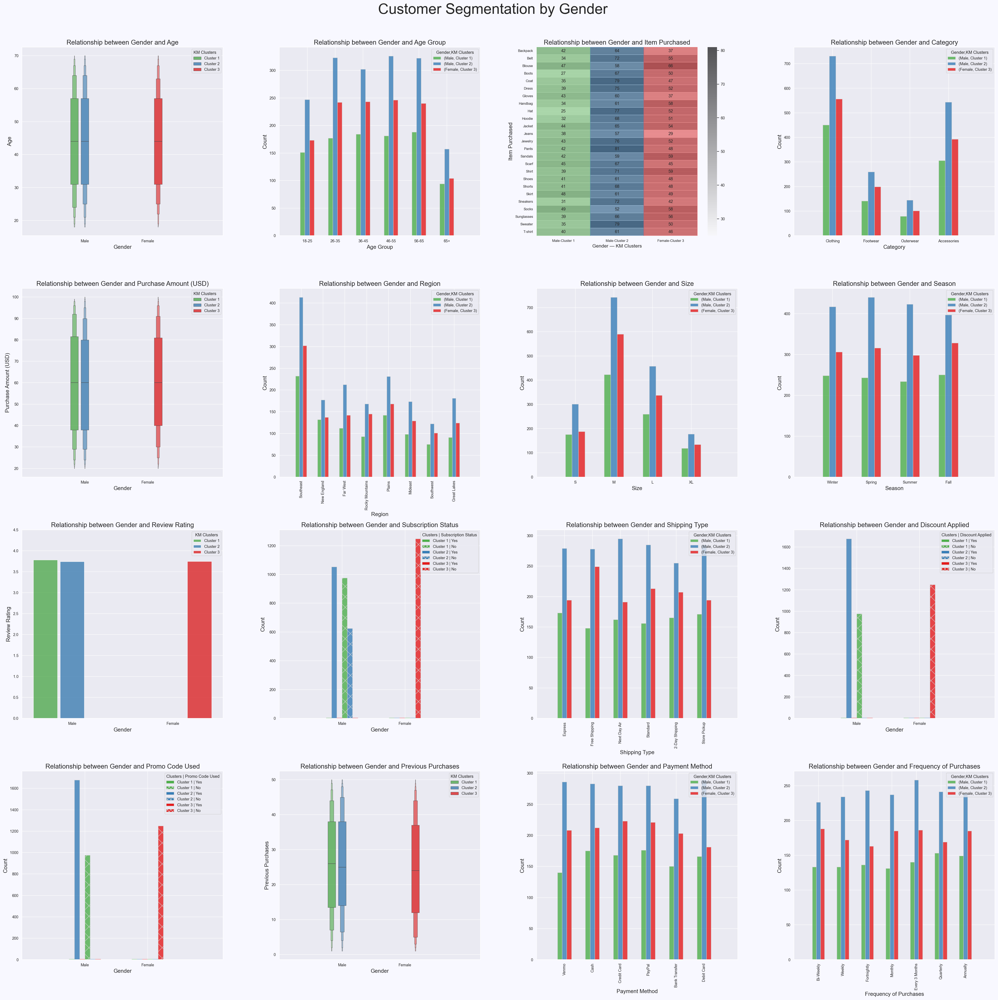

<div style="text-align: center;"><br><hr style="border-top: 1.5px solid black; width: 55%;"><br></div>

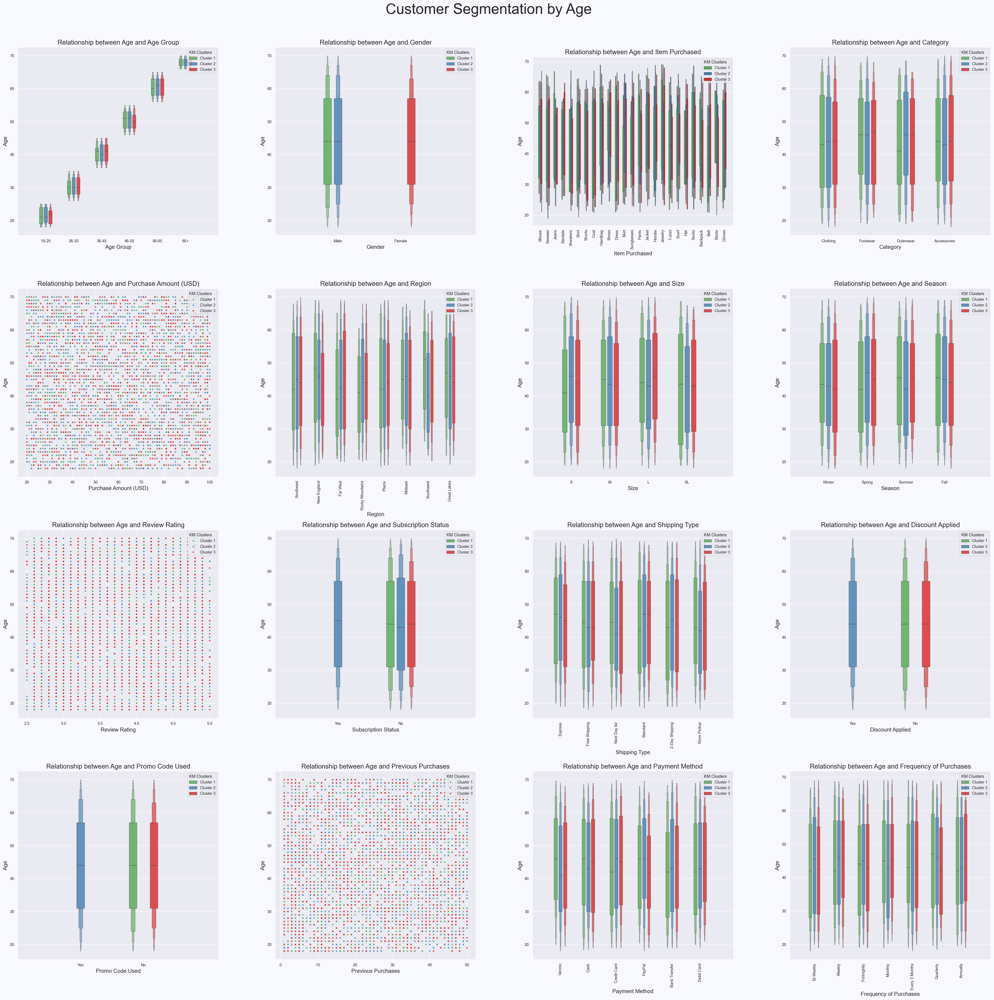

<div style="text-align: center;"><br><hr style="border-top: 1.5px solid black; width: 55%;"><br></div>

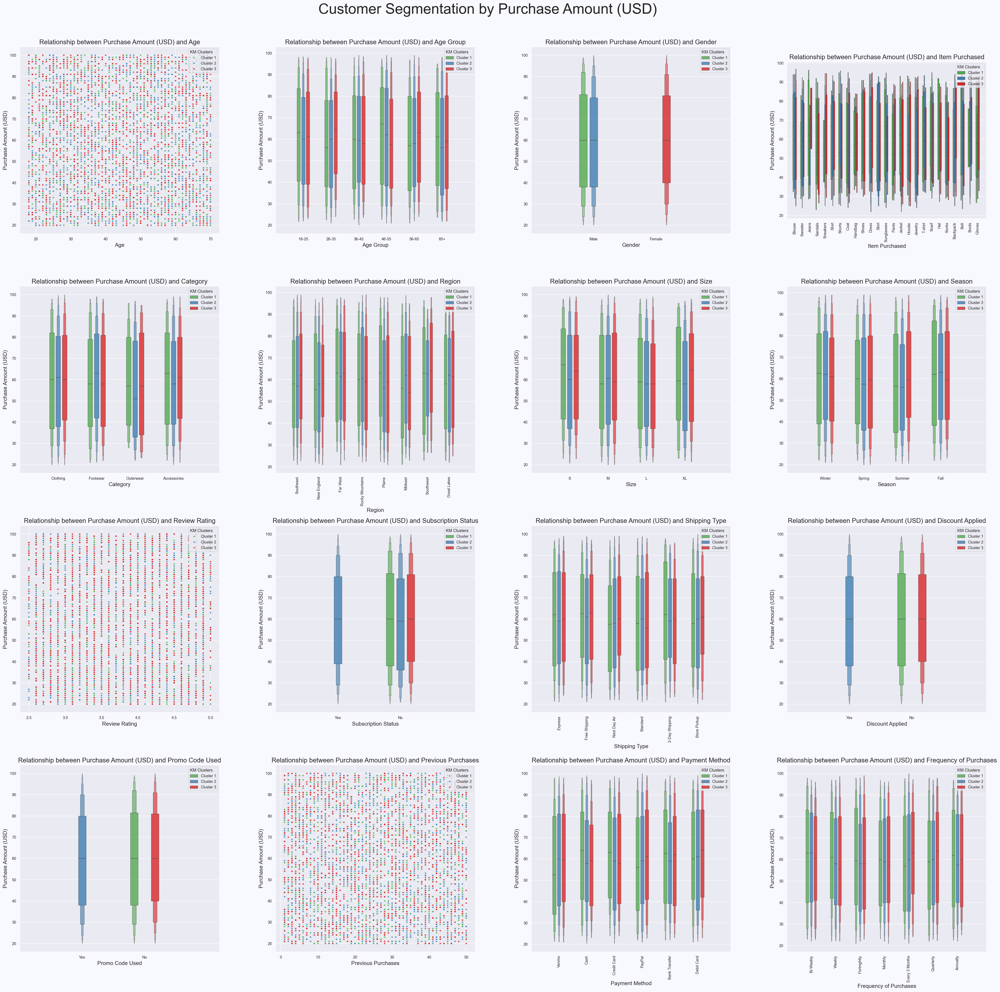

<div style="text-align: center;"><br><hr style="border-top: 1.5px solid black; width: 55%;"><br></div>

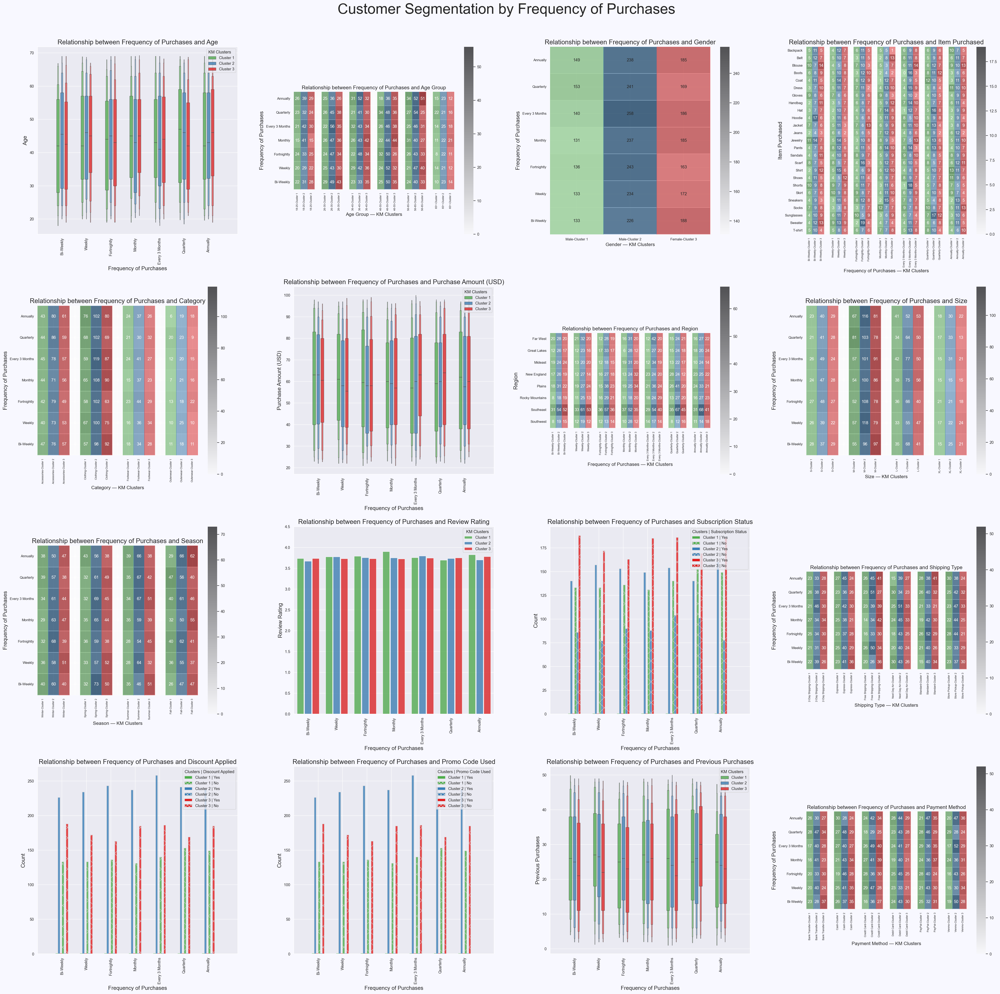

<div style="text-align: center;"><br><hr style="border-top: 1.5px solid black; width: 55%;"><br></div>

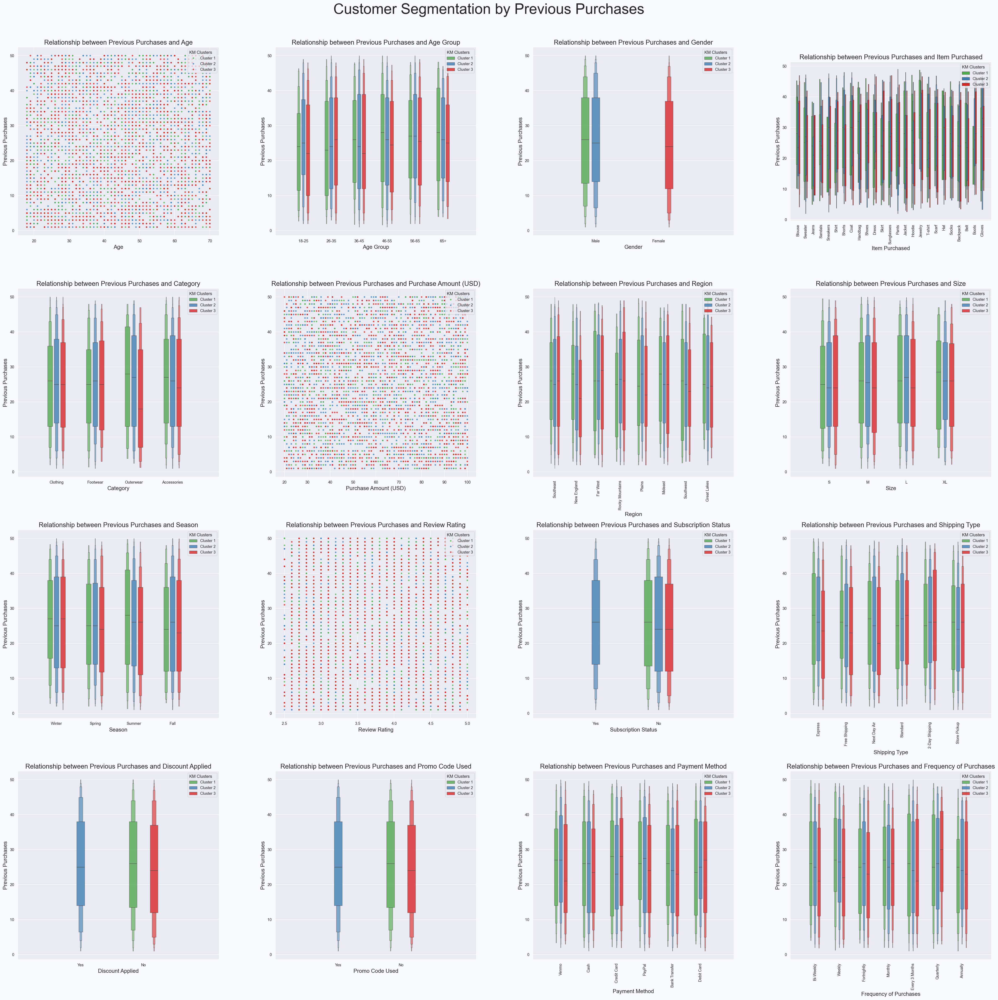

<div style="text-align: center;"><br><hr style="border-top: 1.5px solid black; width: 55%;"><br></div>

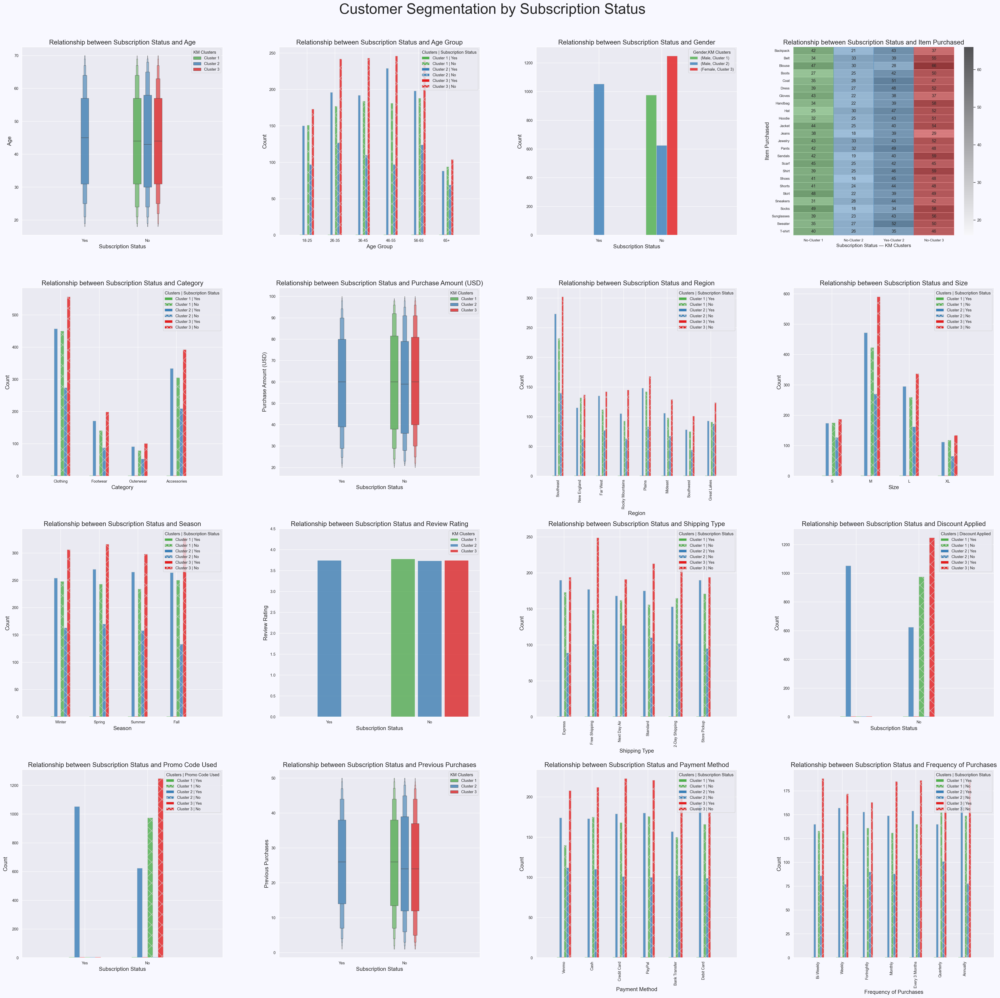

<div style="text-align: center;"><br><hr style="border-top: 1.5px solid black; width: 55%;"><br></div>

In [24]:
#Get independent variables, x_vars
x_vars = df.columns.drop(labels=['Location', 'Color', 'KM Clusters'])

#Get dependent variables, y_vars
y_vars = ['Gender', 'Age', 'Purchase Amount (USD)', 'Frequency of Purchases', 'Previous Purchases', 'Subscription Status']

#Create order dictionary for better presentation of the variables
order_dict = {'Age Group': age_labels, 
              'Size': ['S', 'M', 'L', 'XL'], 
              'Season': ['Winter', 'Spring', 'Summer', 'Fall'], 
              'Frequency of Purchases': ['Bi-Weekly', 'Weekly', 'Fortnightly', 'Monthly', 'Every 3 Months', 'Quarterly', 'Annually']}

#Perform multivariate analysis and report results 
Get_Plots(x_vars=x_vars, y_vars=y_vars, clusters_var='KM Clusters', colors=cluster_colors, order=order_dict)


#### **Results:**

<div style="font-family: Arial; font-size: 11.5pt; line-height:1.7"> 

<b>Multivariate analysis in relation to the customer clusters consolidates and adds more to nuance to the picture. I have done my best to render the data visualizable. Here are some of the better notable results and main takeaways:</b></div> 

<div style="font-family: Arial; font-size: 11pt; line-height:1.7">

- There are no notable differences between the three customer groups across the different variables when analyzing in relation to gender and age, except the Southwestern customers in the loyal male group tend to be younger in age relative to the casual male customers and female customers group. <br> 

-  Consistent with the picture drawn so far, analyzing customer clusters by purchase amounts across the different variables reveals a relationship between customer group, purchase amount, and season. Particularly, it appears that the loyal male group tend to spend least during the summer season, which paradoxically is the season in which they engage in shopping activity most! This again gives credence to the observation that the loyal male customers group tend to shop for and buy items most when they are provided discounts and offers, which explains how the season they shop during the most is also the season their overall purchasing amounts are least relative to the other customer groups. <br> 

-  Second, there's a relationship between customer group and purchase amount in relation to local region: the loyal male customers spend more than the other two groups particularly in Mideast and spend slightly less in the Plains region; the casual male group spend more than the other two groups in the the Plains and spend less in the Great Lakes region; and finally, the female customers group spend slightly more than the two other groups in the Southest in particular. Thus, the loyal male customers drive more sales in the Mideast, less in the Plains; the casual male customers drive more sales in the Plains, less in the Great Lakes; and the female customers drive more sales in the Southeast and remaining more or less consistent with the other two groups across the other regions. Now, it's worth stopping and noting here that since the Midest is one of the lowest regions in sales overall, this means that special attention needs to be paid to the casual male customers and female customers in this region in particular. <br>

-  Analyzing customer clusters by age and frequency of purchase, we find that for frequent shopping, particularly bi-weekly and weekly shopping, the casual customers whom engage in this frequent shopping tend to be slightly younger than the customers in the two other groups. On the other hand, for least frequent shopping, i.e. anually, we find that the female customer group engaging in annual shopping tend to be slightly older than customers in the other groups.  
   - Honing in on age groups rather than absolute age values, we additionally find that young adults and middle-aged customers in the loyal male customers group tend to engage in less bi-weekly, weekly and twice-a-week shopping compared to loyal male customers in the other age groups (except the elderly). Further, Adult females (aged 26 to 35) tend to engage in the most frequent shopping, twice a week, compared to the other female age groups. This is also the case for adult males within the same age group in addition to middle aged adult males (aged 46 to 55) in the loyal male customers group. Those who engage in the least shopping frequency (annually) across the 3 customer groups, tend to be seniors aged 56 to 65 years (in addition to middle aged adult males between 36 and 45 years in the loyal male customer group). <br>
<br>
- Also, consistent with the picture portrayed so far, shopping increases for seasonal shoppers in the casual male group particularly in the fall season. This again is likely because they are offered discounts or offers that are otherwise unavailable for them during the rest of the year, in contrast to the loyal male group.

- Interestingly, analyzing customer clusters by frequency of purchase and subscription status, we find that subscribed male in the loyal customers group tend at starkly higher rates across the different shopping frequency groups compared to their unsubscribed counterpart within the same customer group. That is, these loyal subscribed male customers tend to shop weekly and every two weeks more often than loyal male customers who are unscubscribed. Conversely, unsubscribed customers in the loyal male group tend to shop every 3 months and quarterly the most often, and shop weekly the least often, which is consistent with the behavior of the customers in the two other customer groups in fact, both of whom are unsubscribed as well. The only notable exception is that female customers tend to shop the most frequently (i.e., twice a week) the most often compared to the other groups, although as revealed by customer group x shopping frequency x amounts paid analysis, those most frequent female shoppers tend to pay less compared to females who shop less frequently, presumably as frequent female customers shop for less expensive items when shopping that frequently whereas the more seasonal female customers shop for more expensive ones. Consistent with their overall behavior, unsubscribed male customers in the casual male group tend to shop quarterly the most often.
  
-  Analyzing customer clusters in relation to previous purchases and items purchased, we find that loyal male customers who had a lot of previous experience  with the shop (as indicated by the number of previous purchases) were more likely to opt for t-shirts and sneakers than the other customer groups; casual male customers with lots of previous experience were more likely to opt for jewelry, hoodies, pants, jeans and handbags than the other customer groups (a lot of these purchases in this group are also influenced by age, so we could expect an interaction between previous experience and age in the casual male group when it comes to their current choices of items to buy); and finally females in the female customers group with lots of previous experience were more likely to opt for shoes, boots, or shirts (with the choices of the first two items interacting with age as well), and were least likely to opt for outwear (coats or jackets) compared to male customers in either male groups.
   - Additionally, we find a relationship between customer group, previous purchases and local region. Particularly, we find that female customers in New England and the Plains had the least purchasing history compared to the male customers in the other two groups. Thus, we can infer that female customers in these two regions have less experience with the shop services and thus more attention or marketing effort should be paid to female customers in New England and the Plains in particular. <br>
<br>
-  Analyzing the customer groups by subscription status and age group, we find that those subscribed in the loyal male group tend to be mostly middle-aged adults in the 46-55 age group. This is particularly interesting because this age group drive the most sales generally and the loyal customer male group account for the highest proportion of sales more particularly. This again gives credence to the observation that male customers in the loyal male group tend to be most motivated when given offers and discounts which presumably comes with being subscribed, so the most sales is being driven my middle-aged adult males who are subscribed to the service. This becomes clear when looking at variables like discount applied and promo code used: subscribed males tend to have almost twice as more discounts and promo codes as unsubscribed males within that same customer group. The only exception here is the elderly group whose behavior doesn't seem to differ much with their subscription status, persumably because they shop very infrequently. Nonetheless, we can generally assert that when subscription to the service confers certain benefits like discounts and promo codes, customer engagement greatly increases. <br>

-  Finally, the last notable interaction effect to report is the interaction between customer group, subscription status and region: based on the last graph here, subscription doesn't seem to affect purchasing behavior much in the Great Lakes region, followed by the Southwest, the latter of which is interestingly, as seen earlier, the region with the least customer engagement and sales overall. 
</div>
<br>

<a id="key-insights-and-recommendations"></a>

## Part Seven: Key Insights and Recommendations 


<div style="font-family: Arial; font-size: 11pt; line-height: 1.5"> 
<br>
<strong>As described at length above, clustering analysis yielded three separate clusters, two of which are male dominated and the other is female dominated. What seem to distinguish these three groups most, aside from gender, is loyalty to the brand, purchasing quantities, shopping frequency and subscription to the brand services and related benefits such as discounts and promo codes. One of the male groups is comprised of frequent adult customers, with consistent shopping behavior across the year, a lot of whom are subscribed to the brand and enjoy many benefits in return. The second group of males is comprised of less frequent or seasonal shoppers, mostly shopping in the fall, arguably the shopping season of the year, and who enjoy no subscriptions or related benefits. Lastly, the last customer group obtained consists of mostly adult female customers whose shopping often tends to be either very frequent (twice a week) or very infrequent (annually). This group also have no subscriptions to the brand and enjoy no benefits. Further analysis has been conducted to examine all the subtle interrelations between all the important variables in the data and in relation to customer groups. Considering all that has been discussed, here are some key insights and recommendations to increase sales or curate better marketing campaigns based on the analysis results obtained:</strong>
</div>
<div style="font-family: Arial; font-size: 11pt; line-height: 1.7">
    
- Generally, the current brand would benefit most from advertising more to younger adults and to female customers, catering to their particular needs and shopping habits, from promoting subscriptions to their services, and by increasing advertisement efforts and/or opening more branches in the regions with least sales, most notably in the Southwest, Rocky Mountains, and the Mideast. <br>

- First off, it's clear from the data that three customer groups do not differ much in their spending capacity. Instead, as consistently illustrated over and again, customer engagement increases most when customers are subscribed to the brand and are provided certain benefits like discounts and promo codes in return. And thus it seems that the highest driving force behind sales here is subscription and related benefits. In fact, the presence of discounts and promo codes seem to increase the number of loyal customers and sales coming from this group without really affecting overall spending. That is to say, such benefits seem to lure customers independent of the benefits they actually bear in absolute monetary terms. Indeed, this is the case across the three groups as well as within the loyal male customers group: the overall number of loyal customers without subscribtions or benefits is generally lower compared to the subscribed ones. Discounts and other attractive offers seem to rile people in independent of their spending capabilities, and perhaps also independent of their satisfaction as indicated by their review rating scores (albeit unsatisfied customers generally do not seem to give any rating, so caution should be taken when interpreting this piece of data). Accordingly, it seems particularly important to address young adults and female customers, tailoring an advertisement campaign just for these populations and/or offering more discounts and benefits and facilitating the acquisition of memberships or subscriptions to the service. Subscriptions, discounts and other benefits seem especially important for sales here given that the most loyal group of customers ushering in the highest amount of sales overall seem to shop exlusively through offers, discounts and promo codes, persumably as a result of their subscription status. Thus, facilitating subscriptions to the service is highly predictive of increased sales and whatever marketing campaign to be lunched must promote subscriptions and its benefits for the customers especially for the female group and less frequent male buyers group.
- Second, as costumers in the Southwest, Rocky Mountains, and the Mideast tend to shop least compared to customers in other regions, the current brand may want to open more branches or increase advertisement for these regions to ensure better sales. At any rate, each of these regions have their own determinants influencing their sales. One curious aspect about the Southwest in particular, which is associated with the least sales, is that subscription status doesn't seem to affect sales much in this region. Now as we know subscription status seems to be highly predictive of purchasing behavior, presumably because of the benefits subscription to the brand confers for the customers like discounts and promo codes. However, it seems that there's little benefit to subscription in the Southwest, as there's little to no difference between the purchasing behaviors of subscribers and unsubscribers in that region. Thus, efforts have to be spent to ensure that subscriptions actually confer benefits to the customer. 
- Relatedly, as with the Southwest, analysis revealed that subscription status doesn't seem to influence sales much in the Great Lakes, also one the less well performing regions. Now, again, since subscription status and related benefits seem to be most predictive of sales, the Great Lake branches could improve their sales and benefit most from ensuring that subscribed customers in this region are given reasonable subscription benefits in return to motivate them to engage more. This is particularly pressing here since looking at the relationship between customer group and purchase amounts in the Great Lakes in particular reveals that customers generally, and casual male customers especially, tend to spend lower amounts on purchases overall in the Great Lakes branches. So, even when the number of customers is medium or acceptable, they're still driving lower sales overall. As such, based off all these interacting findings, the Great Lakes branches could greatly improve their sales by, firstly, attending to their male customers better, and secondly, by improving their subscription services more. 
- Moving to the Mideast in particular, one of the top three regions with least sales, we find that overall sales in this region, as indicated by total purchase amounts, is mostly driven by the loyal male customers group, but less so by either of the other two customer groups. Now since the Mideast is one of the lowest regions in sales, it seems particularly imperative to address causal male customers and female customers in this region to bring it to par with the better performing ones. 
- Further, shopping behavior in some of the mentioned regions is also predicted by age. Once again, in the Southwest for instance, young adults in the casual male customers group and young adults in the female customers group are the least engaged. Thus, more efforts seem to be required in addressing younger adults in these two groups, and, as explicated earlier, in ensuring that subscribed customers actually enjoy good benefits in return, which would likely ramp up both subscription rates and overall sales in this region. 
- Finally, given that footwear and outerwear are generally sold less relative to other types of clothes, while this might simply reflect there being less items under these two categories for sale, advertisement and marketing efforts concentrating more on these two categories might increase their sales favorably. This is especially true for female customers as they mostly opt for boots and shoes from this brand. 
</div>
<br>


<br>
<br>